In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
%matplotlib inline

# Linear Regression
from sklearn.linear_model import LinearRegression

# Cross Validate
from sklearn.model_selection import cross_validate

# Decision Tree
from sklearn.tree import DecisionTreeClassifier

# KNN
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix

# PCA
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Random Forest
from sklearn.ensemble import RandomForestClassifier

# SVC
from sklearn.svm import SVC

# Clustering
from sklearn.cluster import KMeans

# Logistic Regression
from sklearn.linear_model import LogisticRegression

# Naive Bayes
from sklearn.naive_bayes import GaussianNB

# Data Collection 

In [2]:
# Read dataset
dataset = pd.read_csv("project-vehicle.csv")

In [3]:
# Length of dataset
len(dataset)

846

In [4]:
# Size of dataset
dataset.shape

(846, 19)

In [5]:
dataset.keys()

Index(['COMPACTNESS', 'CIRCULARITY', 'DISTANCE CIRCULARITY', 'RADIUS RATIO',
       'PR AXIS ASPECT RATIO', 'MAX LENGTH ASPECT RATIO', 'SCATTER RATIO',
       'ELONGATEDNESS', 'PR AXISRECTANGULAR', 'LENGTHRECTANGULAR',
       'MAJORVARIANCE', 'MINORVARIANCE', 'GYRATIONRADIUS', 'MAJORSKEWNESS',
       'MINORSKEWNESS', 'MINORKURTOSIS', 'MAJORKURTOSIS', 'HOLLOWS RATIO',
       'target'],
      dtype='object')

In [6]:
dataset.head(10)

,COMPACTNESS,CIRCULARITY,DISTANCE CIRCULARITY,RADIUS RATIO,PR AXIS ASPECT RATIO,MAX LENGTH ASPECT RATIO,SCATTER RATIO,ELONGATEDNESS,PR AXISRECTANGULAR,LENGTHRECTANGULAR,MAJORVARIANCE,MINORVARIANCE,GYRATIONRADIUS,MAJORSKEWNESS,MINORSKEWNESS,MINORKURTOSIS,MAJORKURTOSIS,HOLLOWS RATIO,target
0,95.0,43.0,96.0,202.0,65.0,10.0,189.0,35.0,22.0,143.0,217.0,534.0,166.0,71.0,6.0,27.0,190.0,197.0,1
1,96.0,52.0,104.0,222.0,67.0,9.0,198.0,33.0,23.0,163.0,217.0,589.0,226.0,67.0,12.0,20.0,192.0,201.0,1
2,107.0,52.0,101.0,218.0,64.0,11.0,202.0,33.0,23.0,164.0,219.0,610.0,192.0,65.0,17.0,2.0,197.0,206.0,1
3,97.0,37.0,78.0,181.0,62.0,8.0,161.0,41.0,20.0,131.0,182.0,389.0,117.0,62.0,2.0,28.0,203.0,211.0,1
4,96.0,54.0,104.0,175.0,58.0,10.0,215.0,31.0,24.0,175.0,221.0,682.0,222.0,75.0,13.0,23.0,186.0,194.0,1
5,97.0,55.0,103.0,197.0,63.0,11.0,215.0,31.0,24.0,172.0,219.0,677.0,219.0,75.0,5.0,24.0,185.0,194.0,1
6,105.0,54.0,105.0,213.0,67.0,10.0,200.0,33.0,23.0,163.0,214.0,597.0,214.0,68.0,10.0,20.0,190.0,198.0,1
7,105.0,52.0,107.0,207.0,60.0,11.0,218.0,31.0,24.0,167.0,221.0,701.0,197.0,66.0,0.0,20.0,191.0,203.0,1
8,89.0,41.0,75.0,143.0,56.0,7.0,146.0,46.0,19.0,137.0,170.0,317.0,156.0,76.0,18.0,5.0,184.0,188.0,1
9,86.0,41.0,66.0,129.0,55.0,7.0,135.0,50.0,18.0,136.0,154.0,266.0,165.0,74.0,3.0,4.0,180.0,187.0,1


Dataset Information
1. COMPACTNESS: Compactness measure of the object./ Nesnenin kompaklık ölçüsü.
2. CIRCULARITY: Circularity measure of the object./ Nesnenin dairesellik ölçüsü.
3. DISTANCE CIRCULARITY: Distance circularity measure of the object./ Nesnenin dairesel uzaklık ölçüsü.
4. RADIUS RATIO: Radius ratio of the object./ Nesnenin yarıçap oranı.
5. PR AXIS ASPECT RATIO: Aspect ratio of the object's PR axis./ PR ekseninin en-boy oranı.
6. MAX LENGTH ASPECT RATIO: Aspect ratio of the object's maximum length./ Maksimum uzunluk en-boy oranı.
7. SCATTER RATIO: Scatter ratio of the object./ Dağılım oranı.
8. ELONGATEDNESS: Elongatedness measure of the object./ Nesnenin uzatılmışlık ölçüsü.
9. PR AXIS RECTANGULAR: Rectangular aspect ratio of the object's PR axis./ PR ekseninin dikdörtgenlik oranı.
10. LENGTH RECTANGULAR: Rectangular aspect ratio of the object's length./ Uzunluk dikdörtgenlik oranı.
11. MAJOR VARIANCE: Major variance of the object./ Büyük varyans.
12. MINOR VARIANCE: Minor variance of the object./ Küçük varyans.
13. GYRATION RADIUS: Gyration radius of the object./ Devir yarıçapı.
14. MAJOR SKEWNESS: Major skewness of the object./ Büyük çarpıklık.
15. MINOR SKEWNESS: Minor skewness of the object./ Küçük çarpıklık.
16. MINOR KURTOSIS: Minor kurtosis of the object./ Küçük kurtosis.
17. MAJOR KURTOSIS: Major kurtosis of the object./ Büyük kurtosis.
18. HOLLOWS RATIO: Hollows ratio of the object./ Boşluk oranı.
19. target: Target variable./ Hedef değişkeni.

In [7]:
dataset.describe()

,COMPACTNESS,CIRCULARITY,DISTANCE CIRCULARITY,RADIUS RATIO,PR AXIS ASPECT RATIO,MAX LENGTH ASPECT RATIO,SCATTER RATIO,ELONGATEDNESS,PR AXISRECTANGULAR,LENGTHRECTANGULAR,MAJORVARIANCE,MINORVARIANCE,GYRATIONRADIUS,MAJORSKEWNESS,MINORSKEWNESS,MINORKURTOSIS,MAJORKURTOSIS,HOLLOWS RATIO,target
count,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.00000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000
mean,93.678487,44.861702,82.088652,168.940898,61.693853,8.567376,168.839243,40.933806,20.582742,147.998818,188.625296,439.911348,174.70331,72.462175,6.377069,12.599291,188.932624,195.632388,2.477541
std,8.234474,6.169866,15.771533,33.472183,7.888251,4.601217,33.244978,7.811560,2.592138,14.515652,31.394837,176.692614,32.54649,7.486974,4.918353,8.931240,6.163949,7.438797,1.105700
min,73.000000,33.000000,40.000000,104.000000,47.000000,2.000000,112.000000,26.000000,17.000000,118.000000,130.000000,184.000000,109.00000,59.000000,0.000000,0.000000,176.000000,181.000000,1.000000
25%,87.000000,40.000000,70.000000,141.000000,57.000000,7.000000,146.250000,33.000000,19.000000,137.000000,167.000000,318.250000,149.00000,67.000000,2.000000,5.000000,184.000000,190.250000,1.250000
50%,93.000000,44.000000,80.000000,167.000000,61.000000,8.000000,157.000000,43.000000,20.000000,146.000000,178.500000,364.000000,173.00000,71.500000,6.000000,11.000000,188.000000,197.000000,2.000000
75%,100.000000,49.000000,98.000000,195.000000,65.000000,10.000000,198.000000,46.000000,23.000000,159.000000,217.000000,587.000000,198.00000,75.000000,9.000000,19.000000,193.000000,201.000000,3.000000
max,119.000000,59.000000,112.000000,333.000000,138.000000,55.000000,265.000000,61.000000,29.000000,188.000000,320.000000,1018.000000,268.00000,135.000000,22.000000,41.000000,206.000000,211.000000,4.000000


Count: The number of non-null values in each column, which is 846 for all columns, indicating that there are no missing values.

Mean: The average value of each column.

Std: The standard deviation, which measures the dispersion or variability of the values in each column.

Min: The minimum value in each column.

25%: The 25th percentile, which is the value below which 25% of the data falls.

50%: The median or 50th percentile, which represents the middle value of the data.

75%: The 75th percentile, which is the value below which 75% of the data falls.

Max: The maximum value in each column.

In [8]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   COMPACTNESS              846 non-null    float64
 1   CIRCULARITY              846 non-null    float64
 2   DISTANCE CIRCULARITY     846 non-null    float64
 3   RADIUS RATIO             846 non-null    float64
 4   PR AXIS ASPECT RATIO     846 non-null    float64
 5   MAX LENGTH ASPECT RATIO  846 non-null    float64
 6   SCATTER RATIO            846 non-null    float64
 7   ELONGATEDNESS            846 non-null    float64
 8   PR AXISRECTANGULAR       846 non-null    float64
 9   LENGTHRECTANGULAR        846 non-null    float64
 10  MAJORVARIANCE            846 non-null    float64
 11  MINORVARIANCE            846 non-null    float64
 12  GYRATIONRADIUS           846 non-null    float64
 13  MAJORSKEWNESS            846 non-null    float64
 14  MINORSKEWNESS            8

Our dataset has a total of 19 columns (variables).
Each column has been identified with data types: float64 and int64.
There are 846 observations (rows) in your dataset.
There are no missing values for any of the columns (the non-null count values are all 846).

Veri setinde toplamda 19 sütunu (değişkeni) vardır.
Her bir sütunun veri tipi float64 veya int64 olarak belirlenmiştir.
Veri setinizde 846 gözlem (satır) bulunmaktadır.
Tüm sütunlar için eksik değer yoktur (non-null count değerleri 846 olarak görülmektedir).

# Select Target Value

In [9]:
# Finding the unique values of the target variable in the dataset
dataset.target.unique()

array([1, 2, 3, 4], dtype=int64)

In [10]:
# Finding the number of each value of the target variable by grouping
print(dataset.groupby('target').size())

target
1    212
2    217
3    218
4    199
dtype: int64


<AxesSubplot:ylabel='Density'>

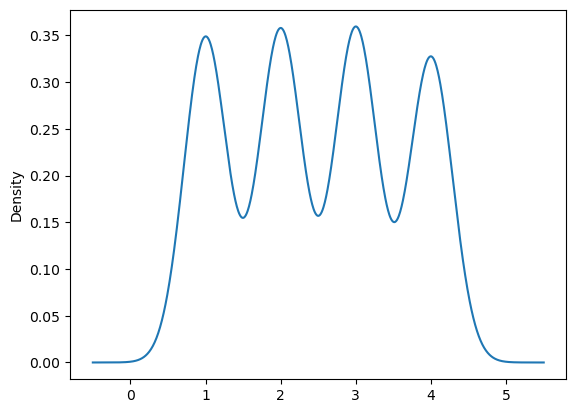

In [11]:
# Plot the density graph of the target variable
dataset.target.plot.density()

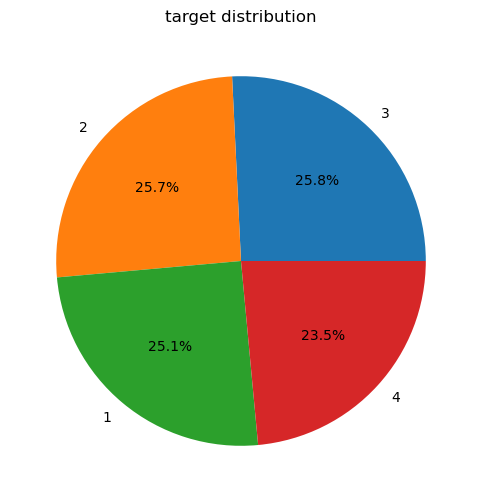

In [12]:
# A pie chart or donut chart is used to show the percentages of categorical data.
# Kategorik verilerin yüzdesel oranlarını göstermek için pasta grafiği veya donut grafiği kullanılır.

# Select the categorical variable
categorical_var = 'target'

# Calculate the values and counts of the categorical variable in the dataset
category_counts = dataset[categorical_var].value_counts()
categories = category_counts.index
counts = category_counts.values

# Draw the pie chart
plt.figure(figsize=(8, 6))
plt.pie(counts, labels=categories, autopct='%1.1f%%')
plt.title(f"{categorical_var} distribution")
plt.show()

<Figure size 1000x600 with 0 Axes>

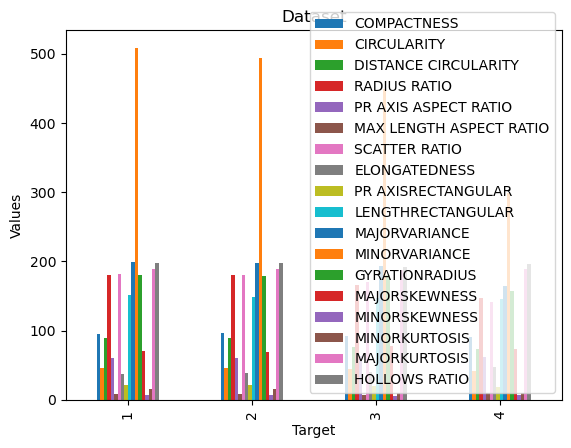

In [13]:
# Show the averages of each columns as histograms
plt.figure(figsize=(10,6))
data_mean = dataset.groupby(dataset.target).mean()
data_mean.plot.bar()
plt.title("Dataset")
plt.xlabel("Target")
plt.ylabel("Values")
plt.show()

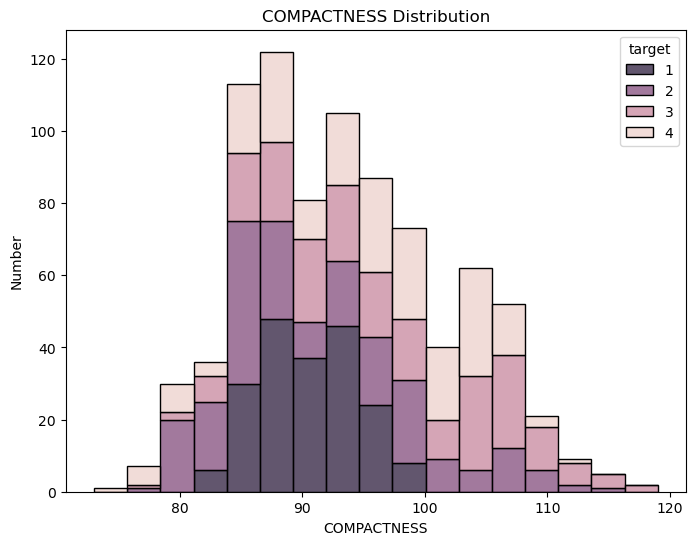

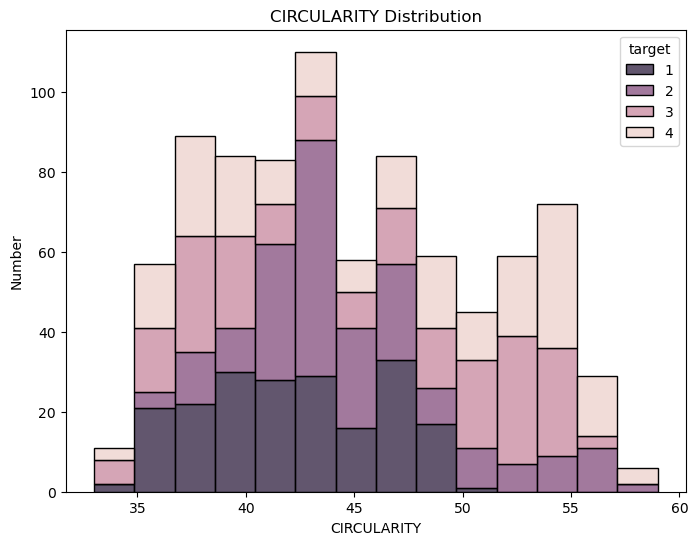

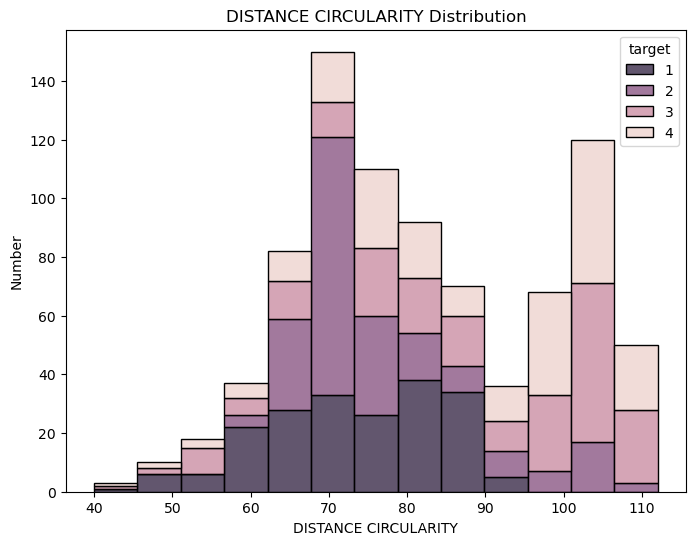

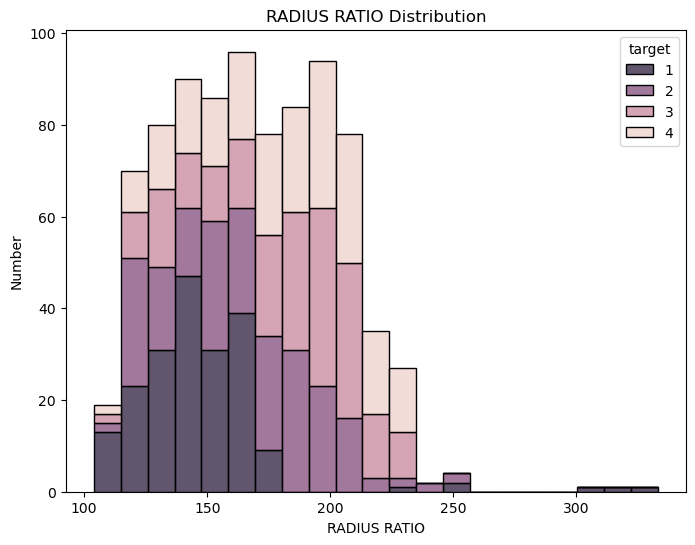

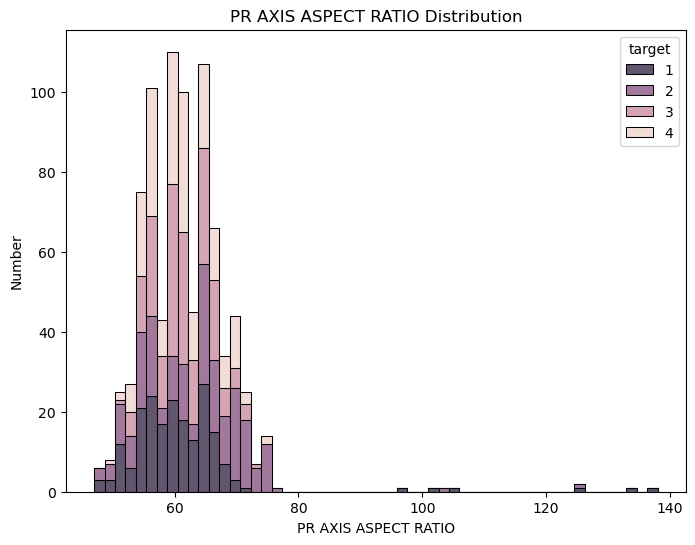

...

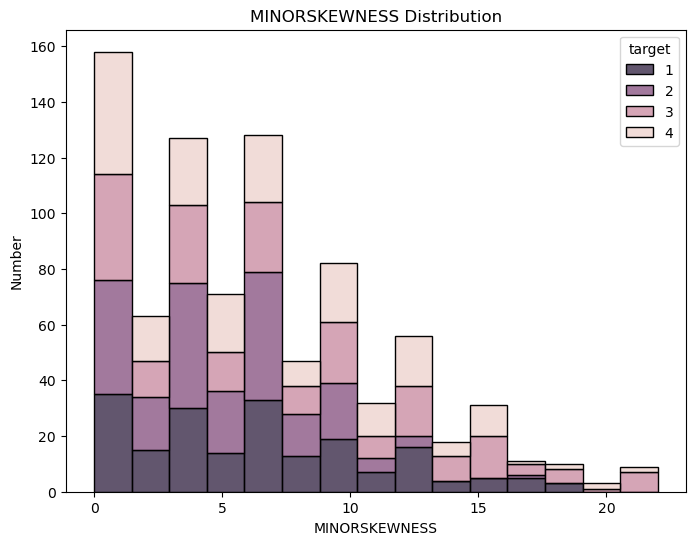

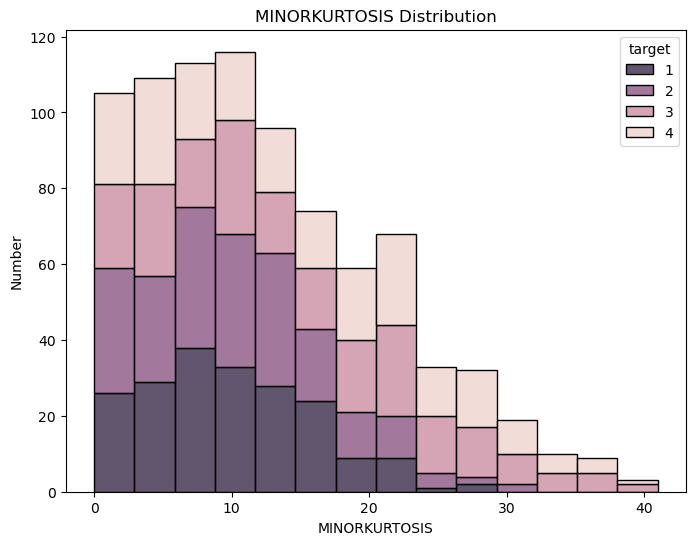

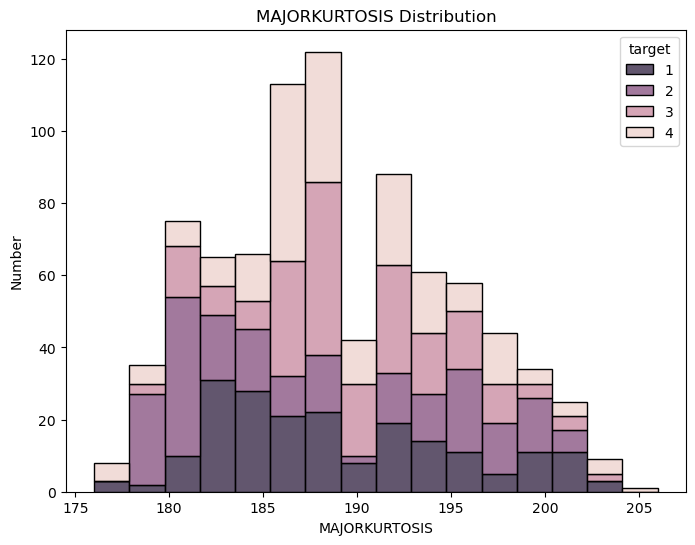

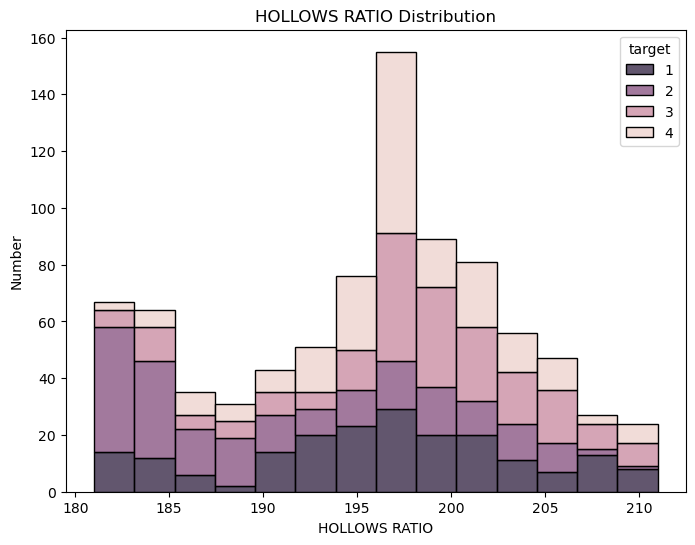

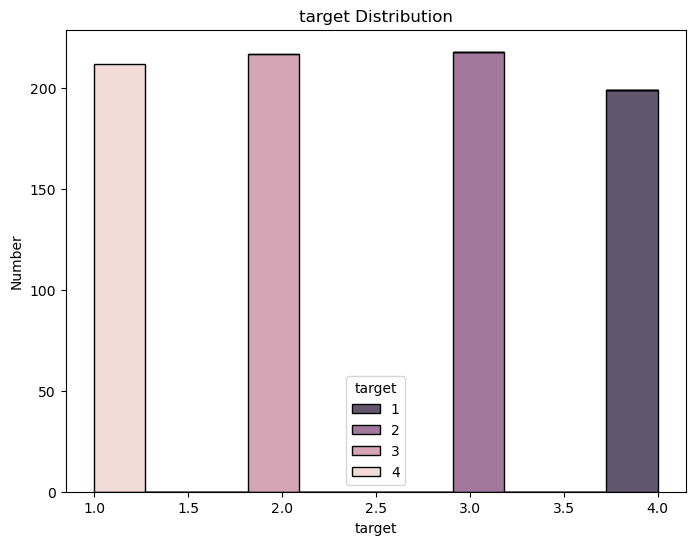

In [14]:
# Used to show the distribution or density of the data set.
# Veri setinin dağılımını veya yoğunluğunu göstermek için kullanılır.

target_var = 'target'

# Draw a scatter plot for each categorical variable
for var in dataset:
    plt.figure(figsize=(8, 6))
    sns.histplot(data=dataset, x=var, hue=target_var, multiple='stack')
    plt.title(f"{var} Distribution")
    plt.xlabel(var)
    plt.ylabel("Number")
    plt.legend(title='target', labels=dataset[target_var].unique())
    plt.show()

We can use a boxplot to show the relationship of a numeric property to a target variable. The boxplot visualizes the distribution of property values between different target classes.

Sayısal bir özelliğin hedef değişkenle ilişkisini göstermek için kutu grafiği(boxplot) kullanabiliriz. Kutu grafiği, farklı hedef sınıflar arasındaki özellik değerlerinin dağılımını görselleştirir.

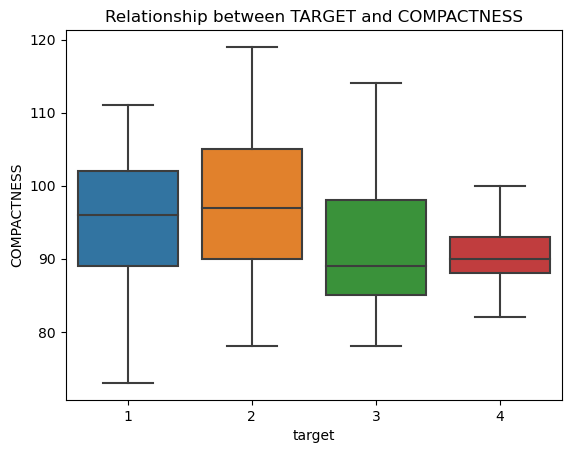

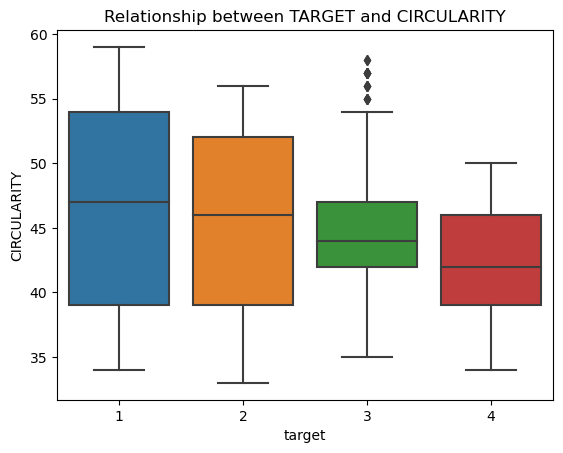

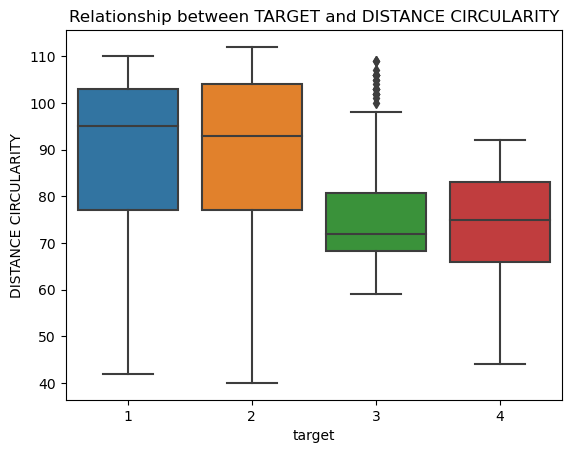

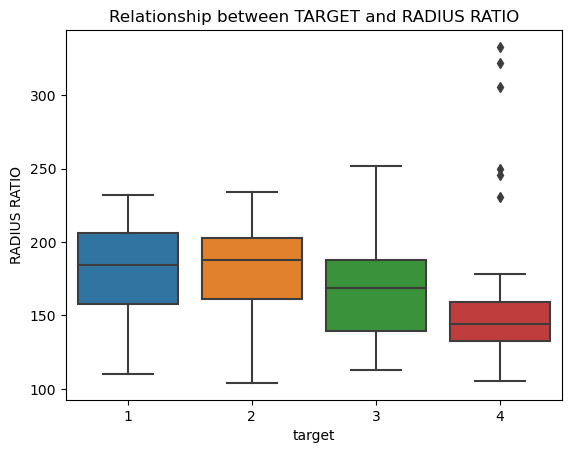

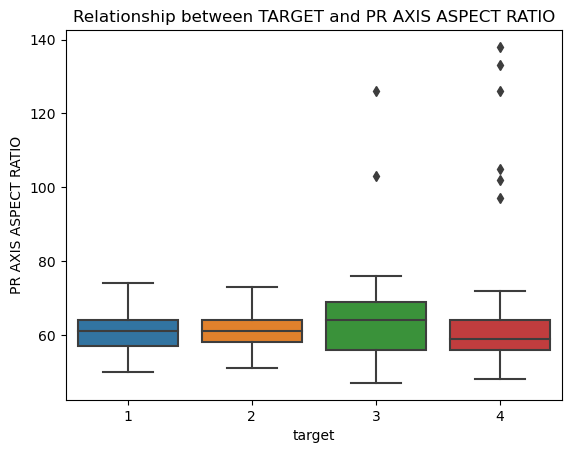

...

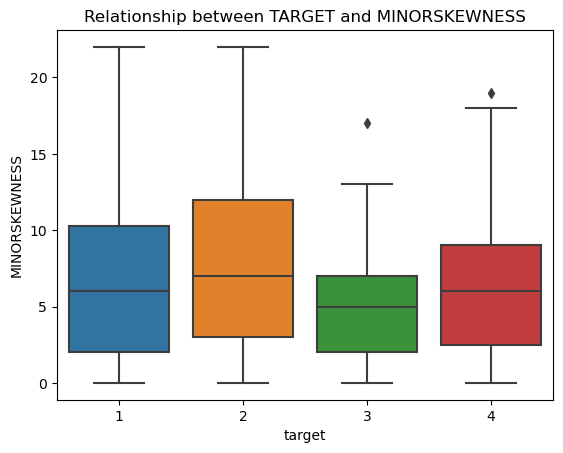

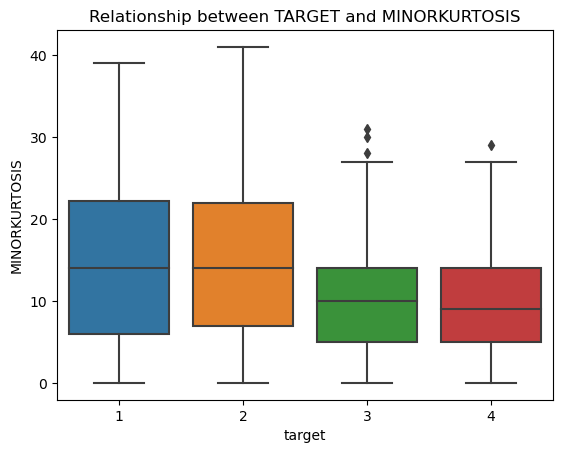

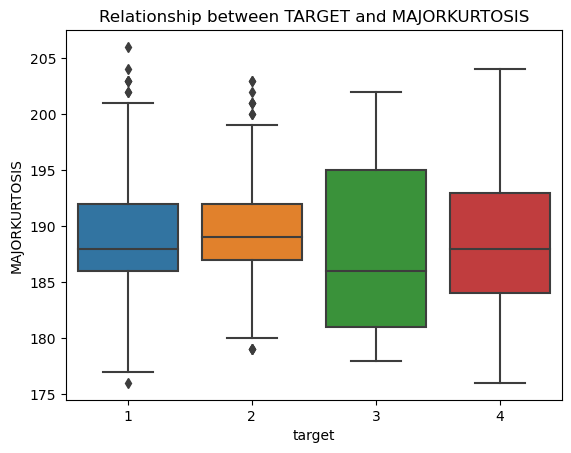

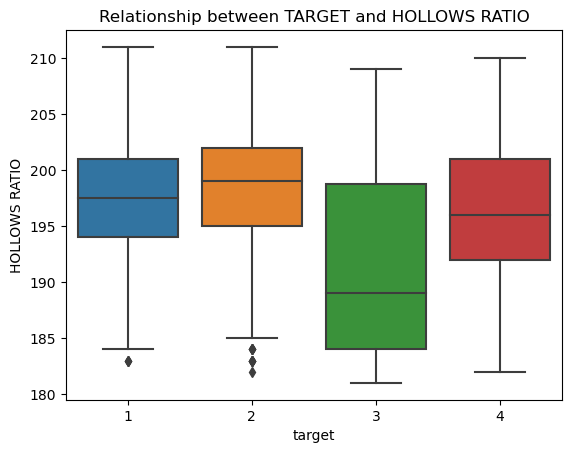

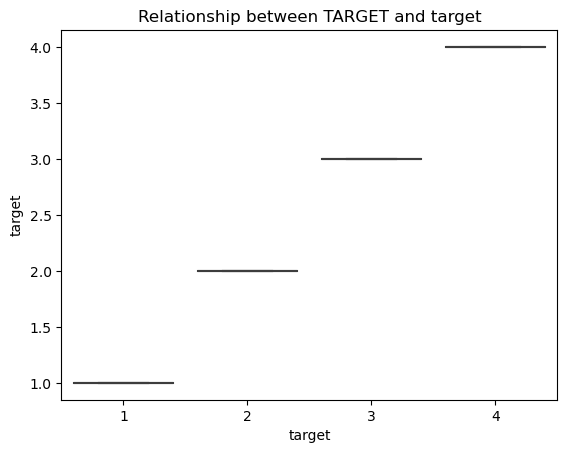

In [15]:
for column in dataset.columns:
    sns.boxplot(x=dataset['target'], y=dataset[column])
    plt.title("Relationship between TARGET and "+column)
    plt.show()

We can use the violin plot to see the relationship of a numerical feature to a categorical target variable. Violin plot shows the distribution of the feature for each category and also includes boxplot information.

Sayısal bir özelliğin kategorik hedef değişkenle ilişkisini görmek için violin plot kullanabiliriz. Violin plot, her bir kategoriye ait özelliğin dağılımını gösterir ve aynı zamanda kutu grafiği bilgisini de içerir.

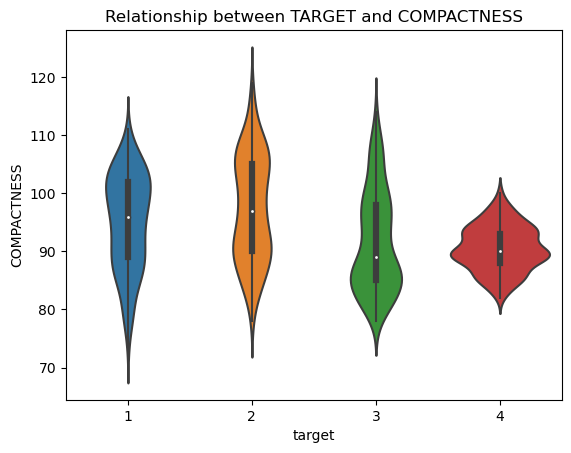

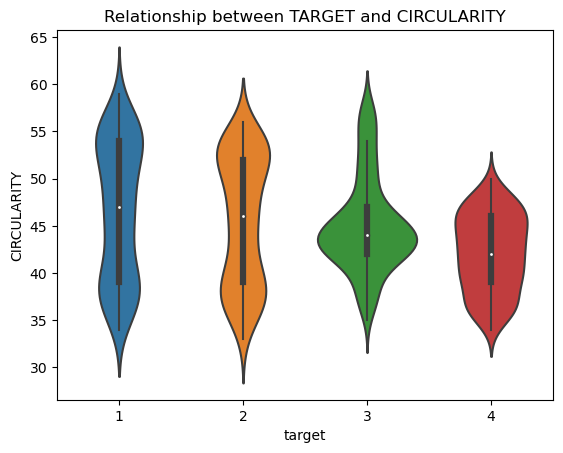

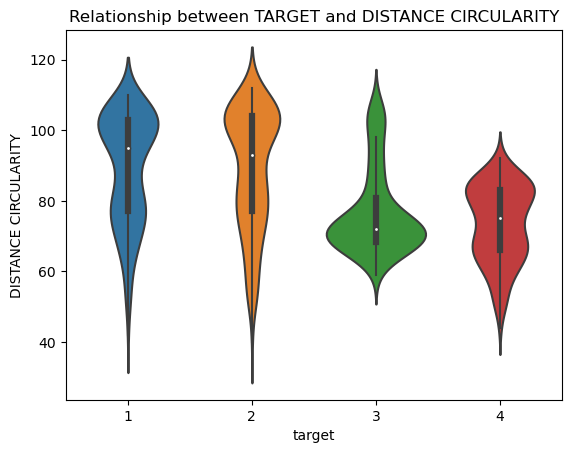

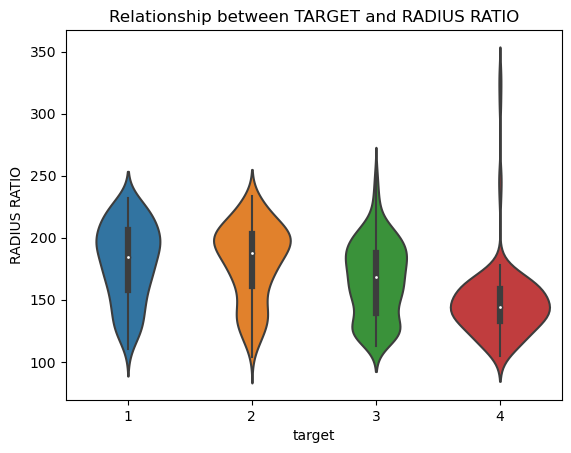

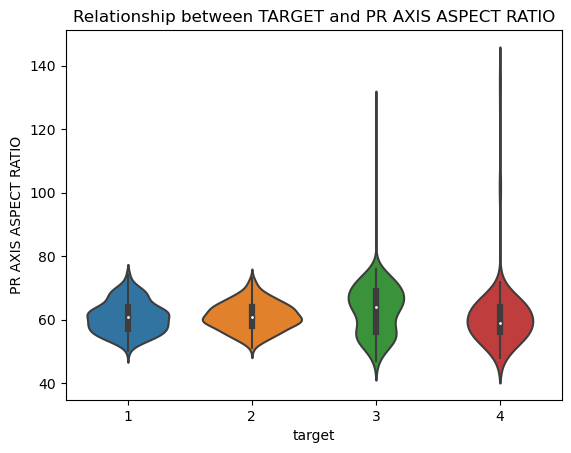

...

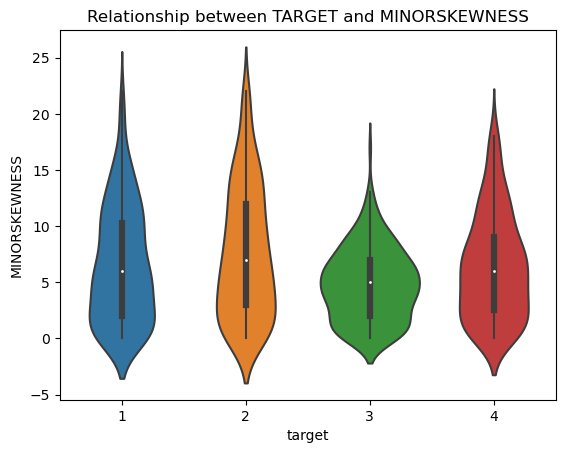

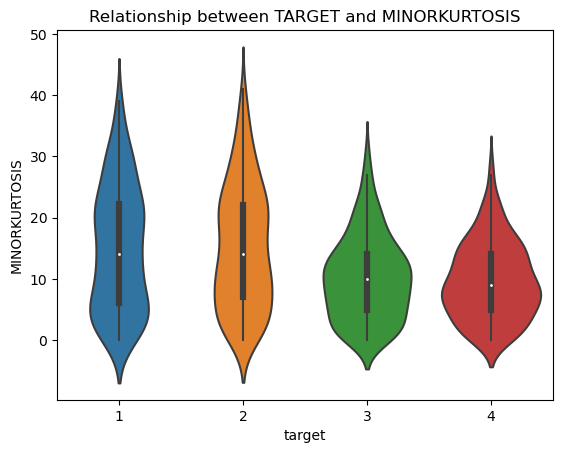

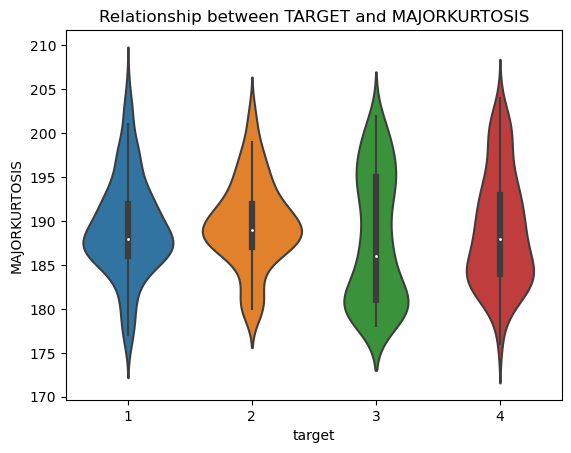

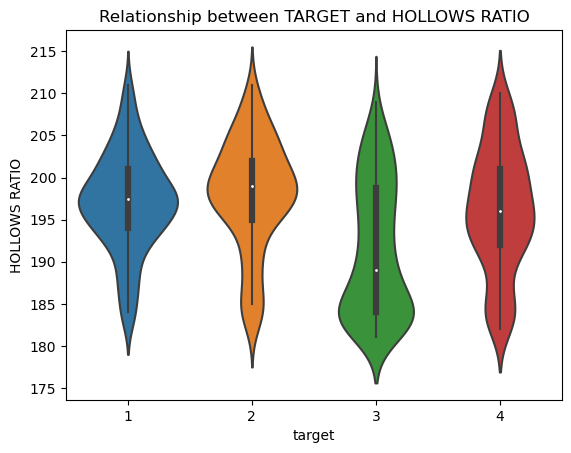

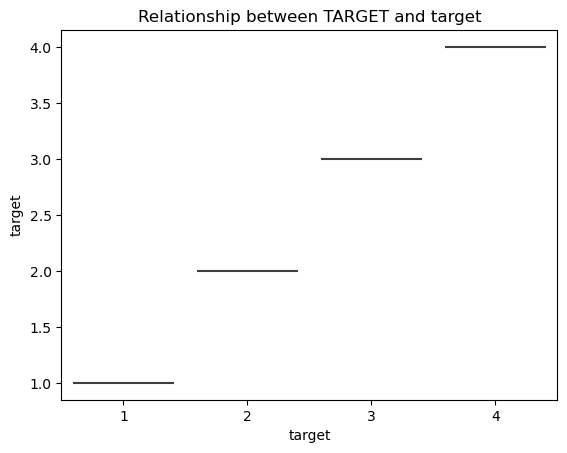

In [16]:
for column in dataset.columns:
    sns.violinplot(x=dataset['target'], y=dataset[column])
    plt.xlabel('target')
    plt.ylabel(column)
    plt.title("Relationship between TARGET and "+column)
    plt.show()

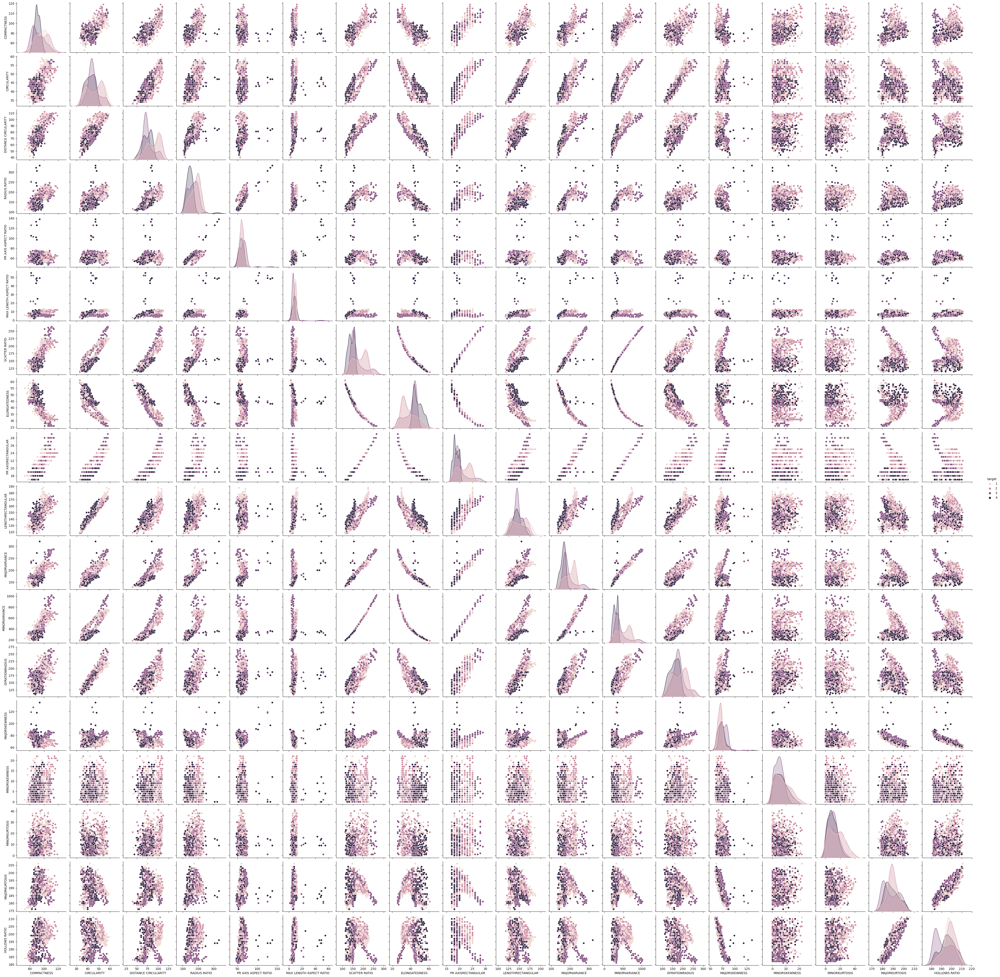

In [17]:
sns.pairplot(dataset,hue='target')
plt.show()

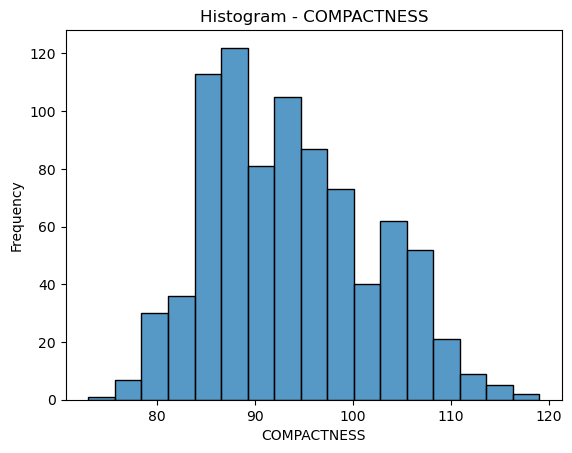

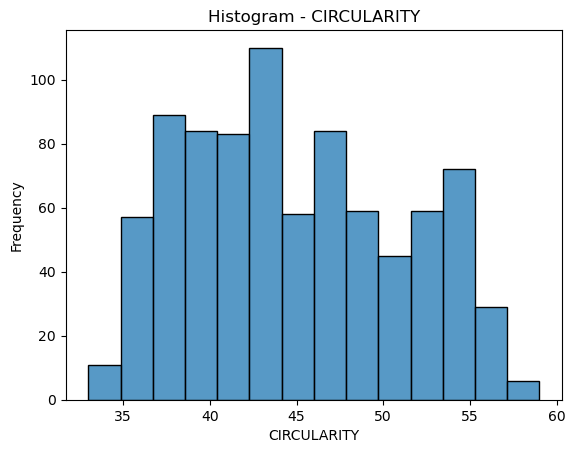

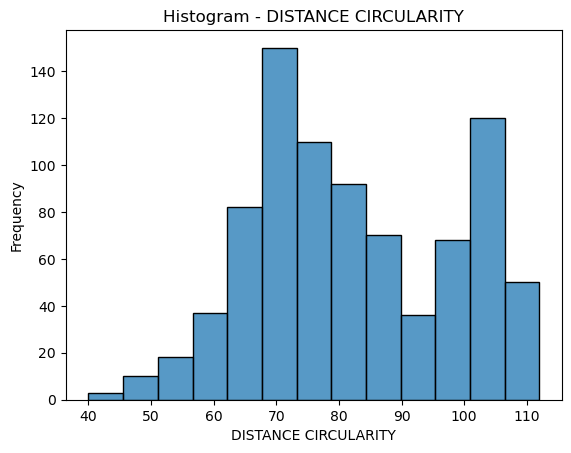

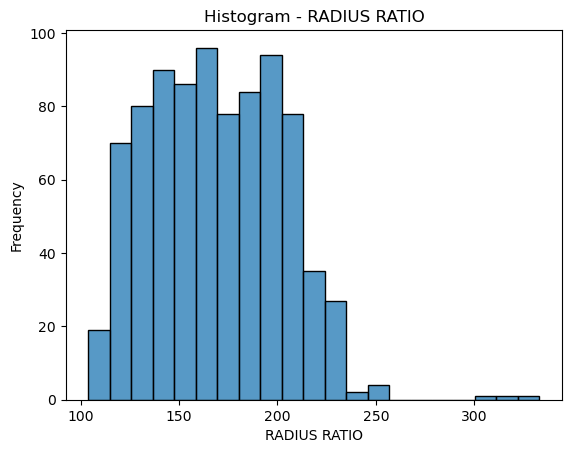

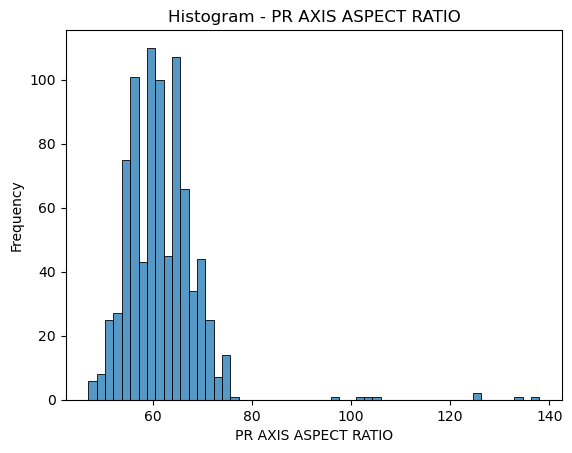

...

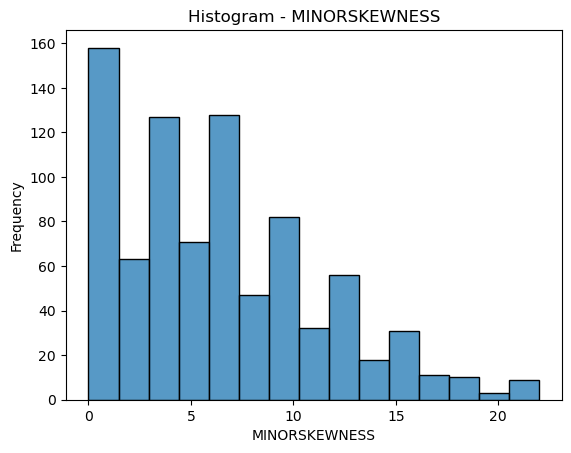

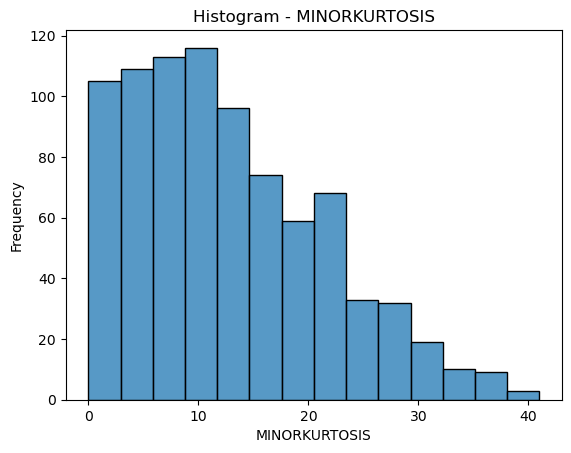

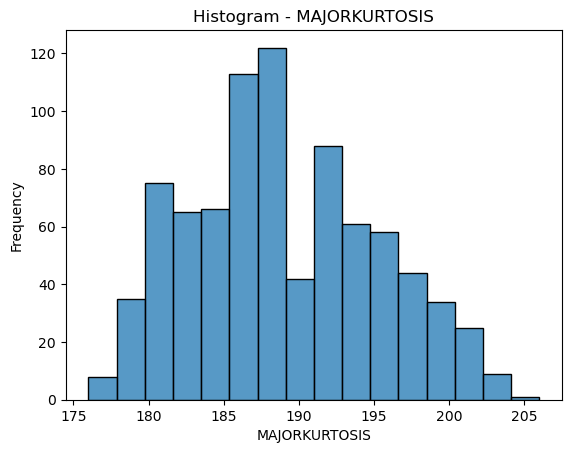

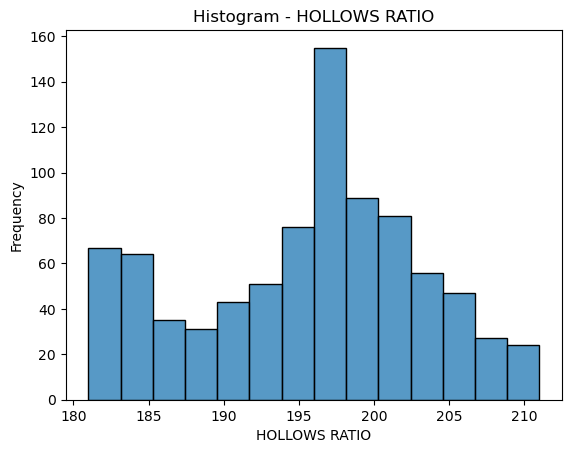

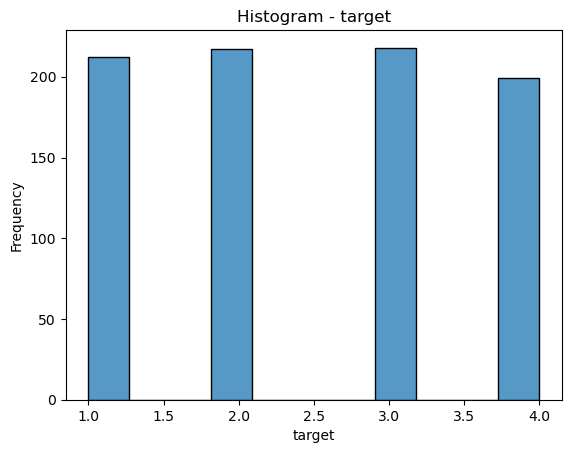

In [18]:
for column in dataset.columns:
    sns.histplot(dataset[column])
    plt.xlabel(column)
    plt.ylabel("Frequency")
    plt.title("Histogram - {}".format(column))
    plt.show()

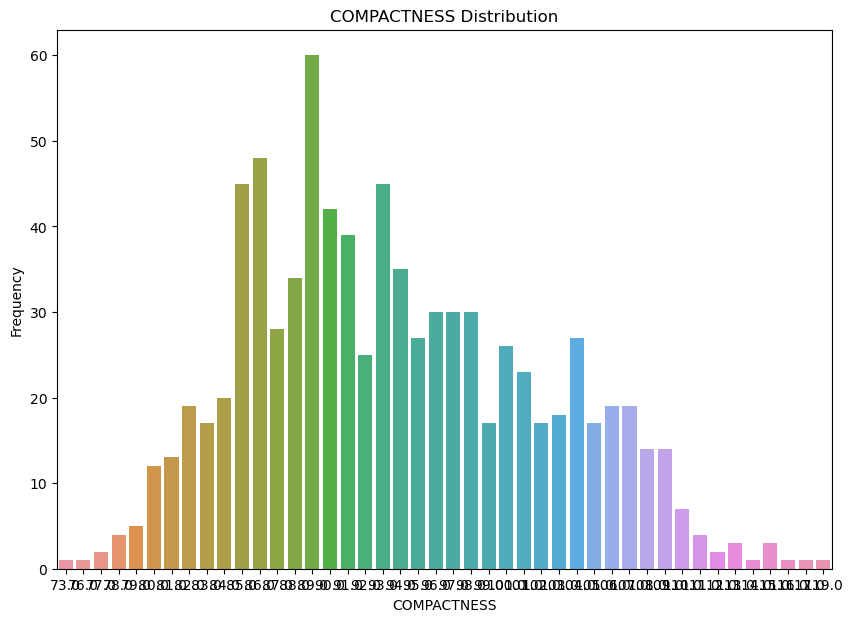

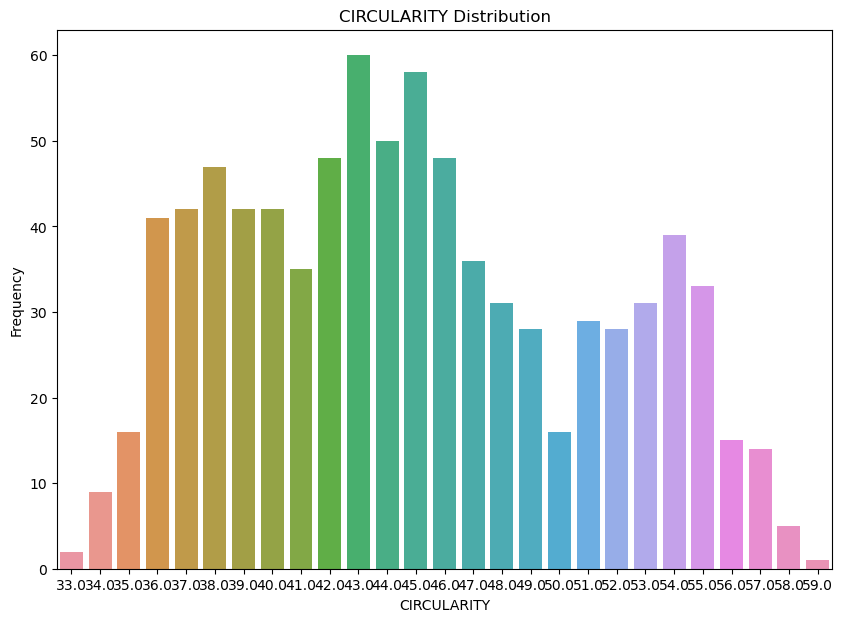

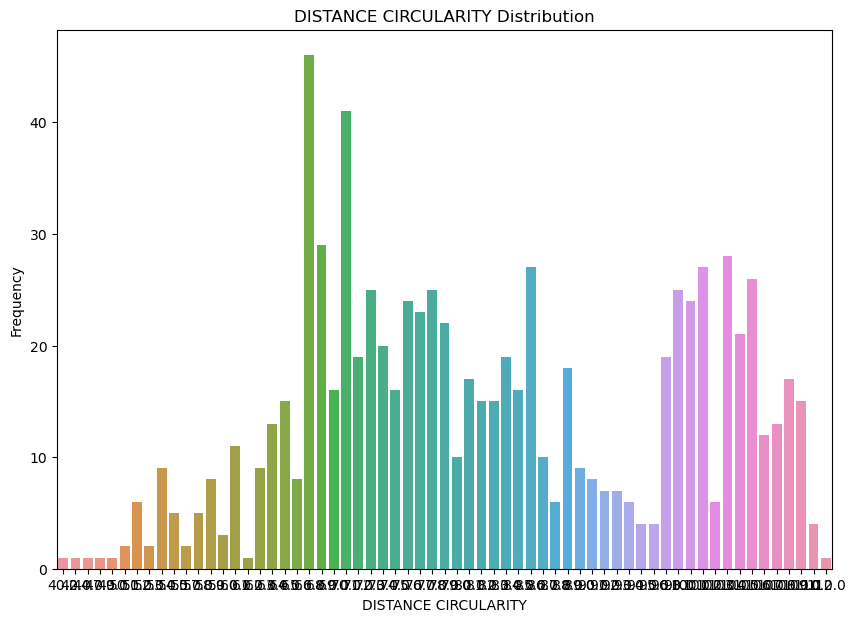

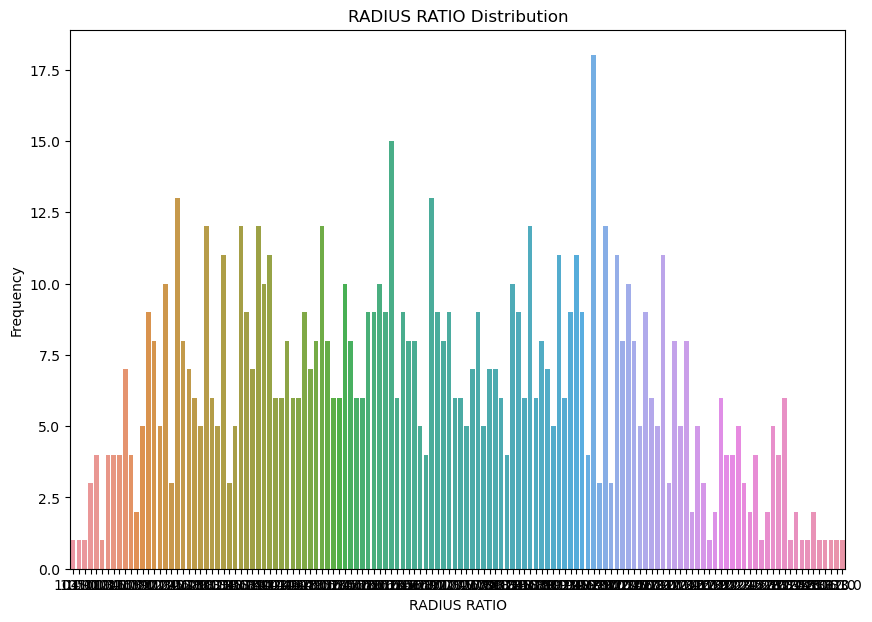

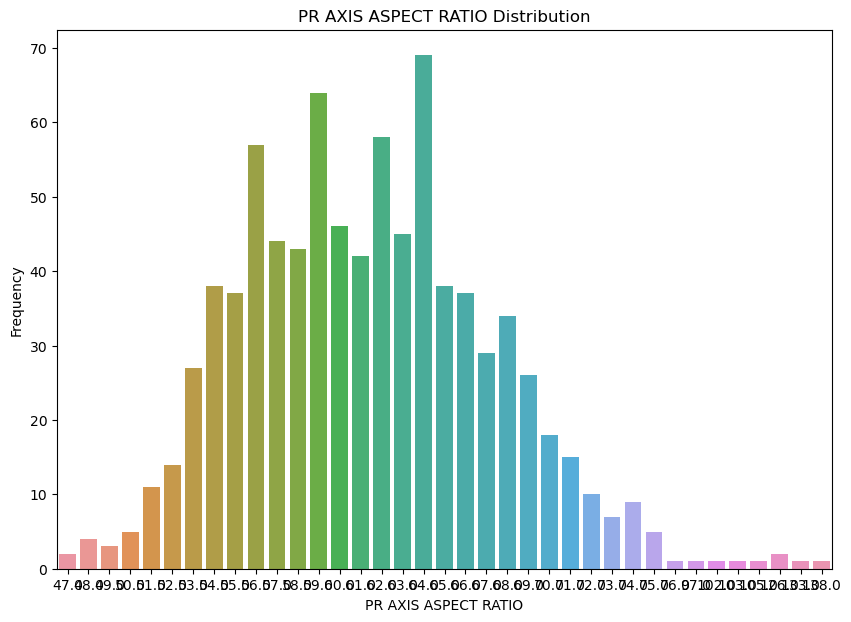

...

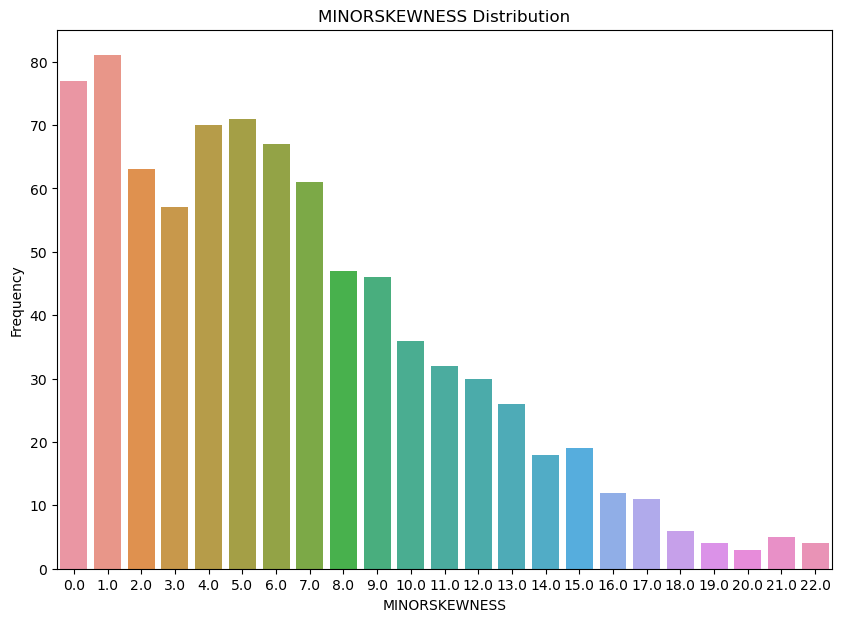

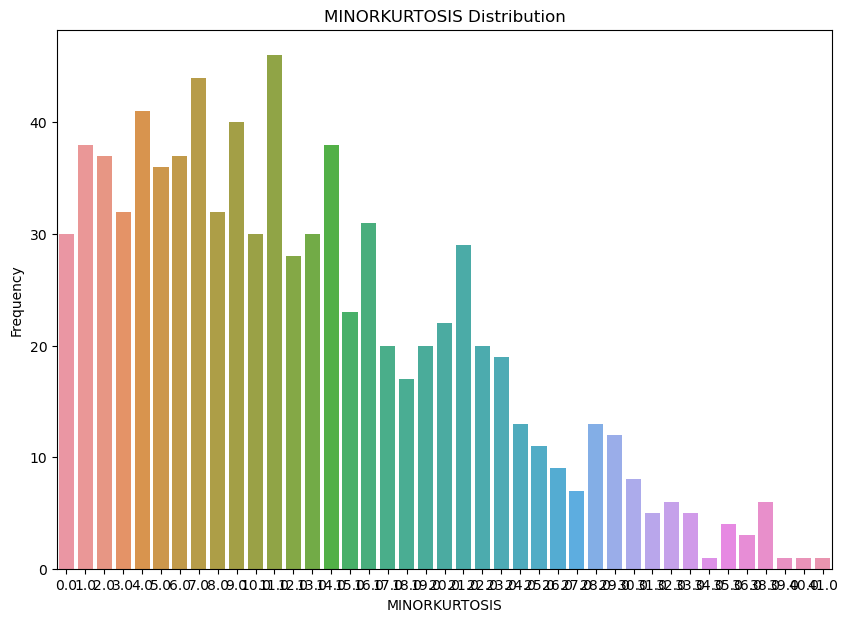

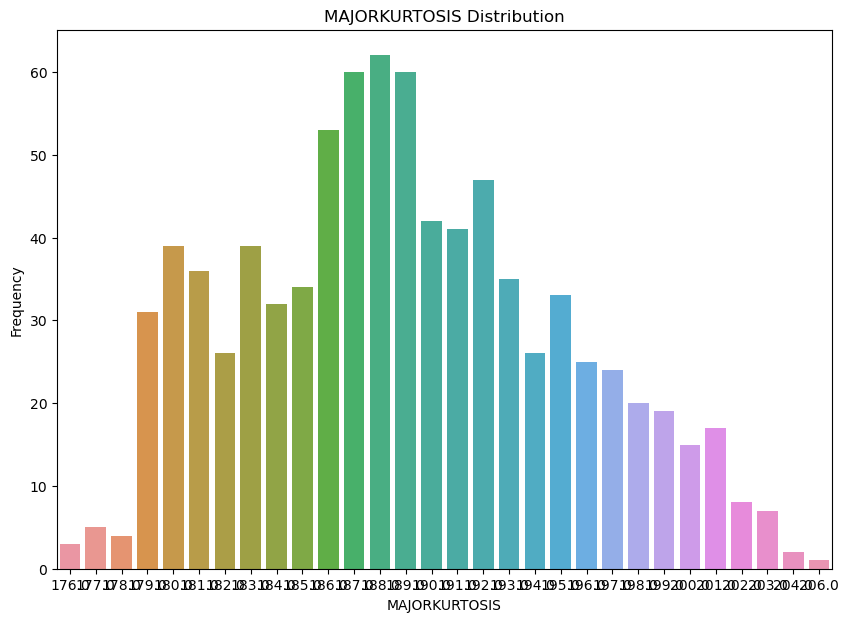

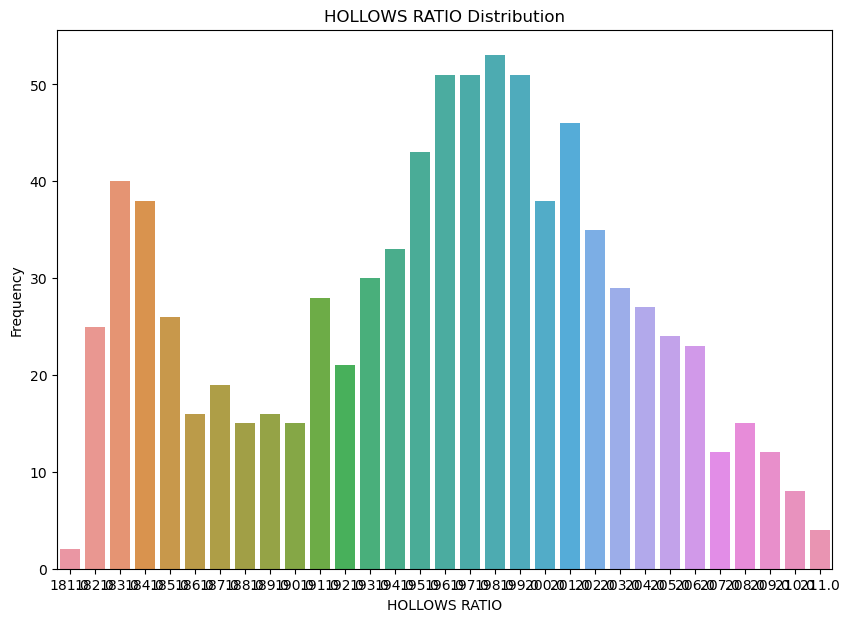

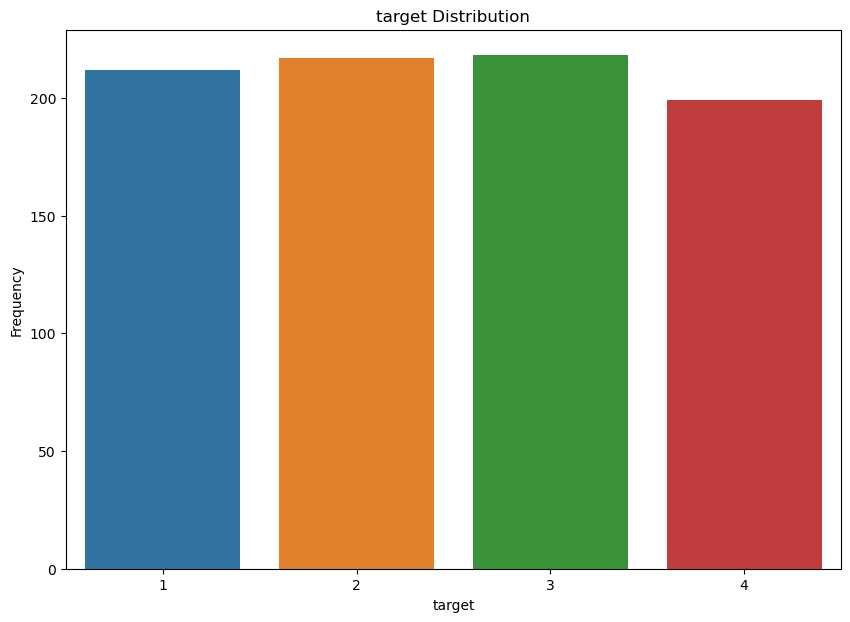

In [19]:
# It is used to show the distribution of categorical data or comparisons between groups.
# Kategorik verilerin dağılımını veya gruplar arasındaki karşılaştırmaları göstermek için kullanılır.

for var in dataset:
    plt.figure(figsize=(10, 7))
    sns.countplot(data=dataset, x=var)
    plt.title(f"{var} Distribution")
    plt.xlabel(var)
    plt.ylabel("Frequency")
    plt.show()

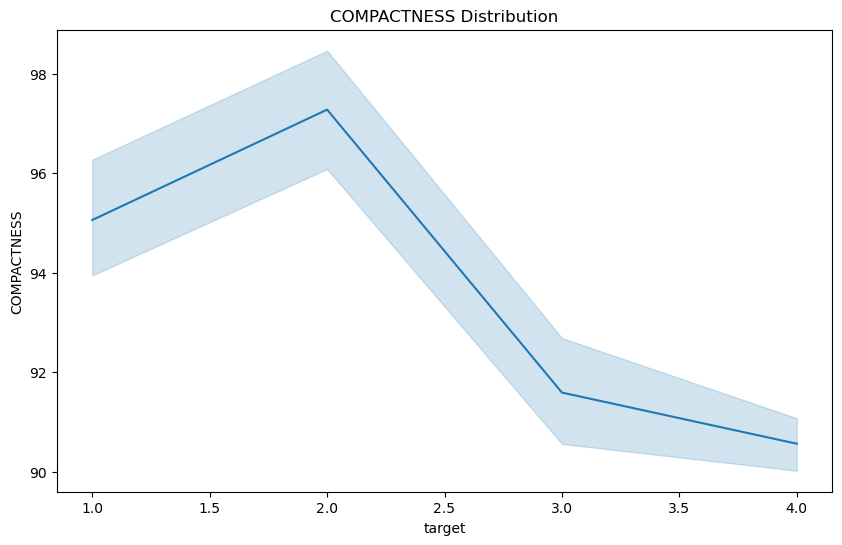

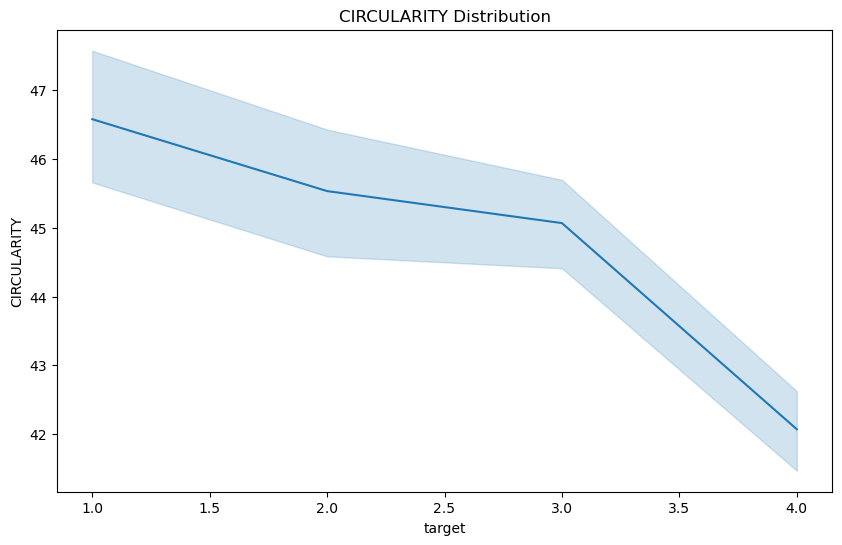

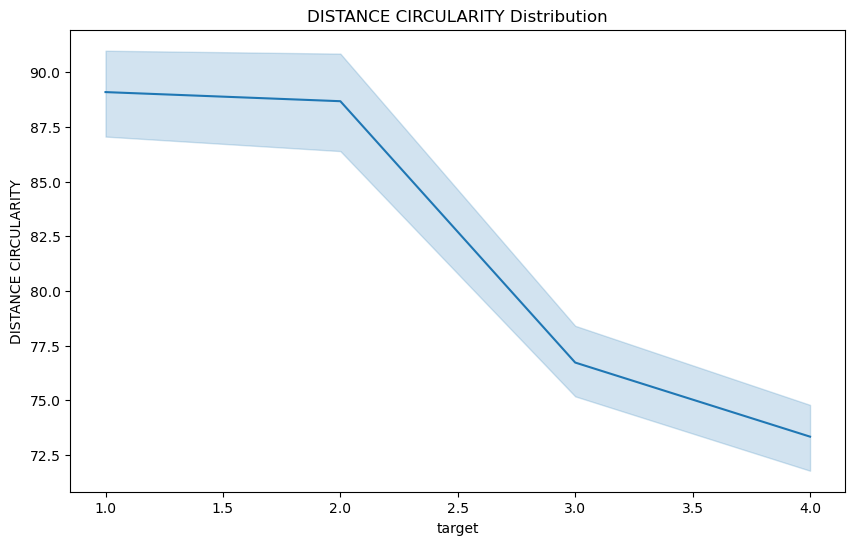

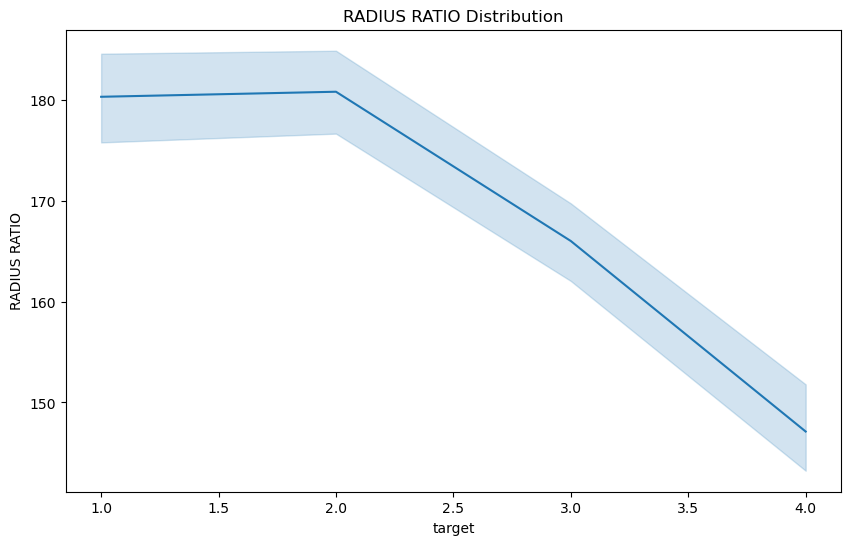

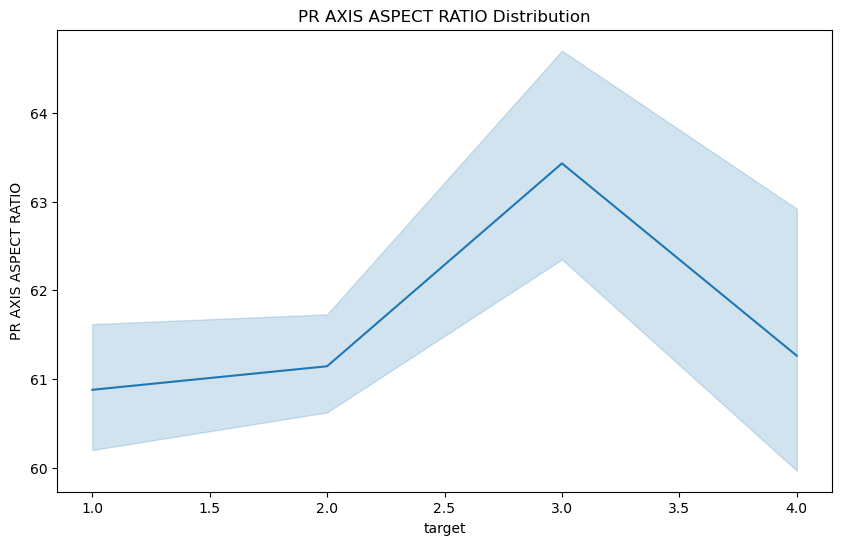

...

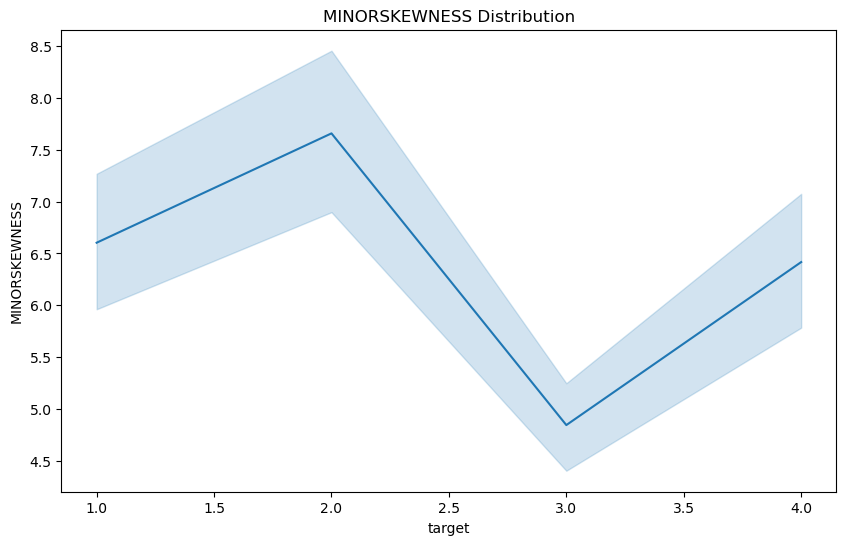

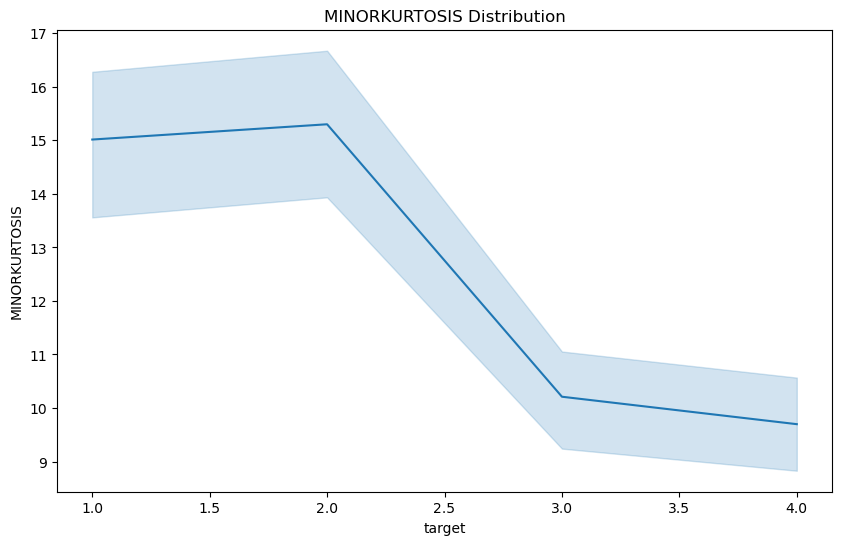

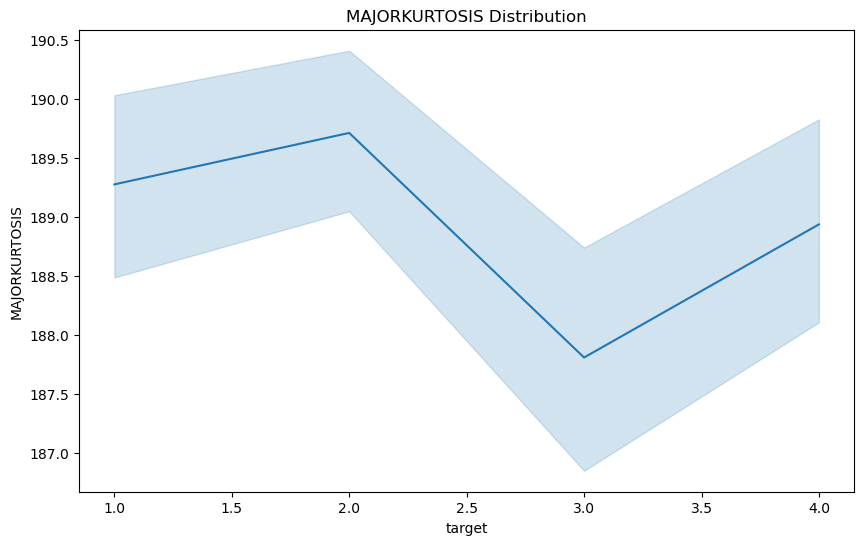

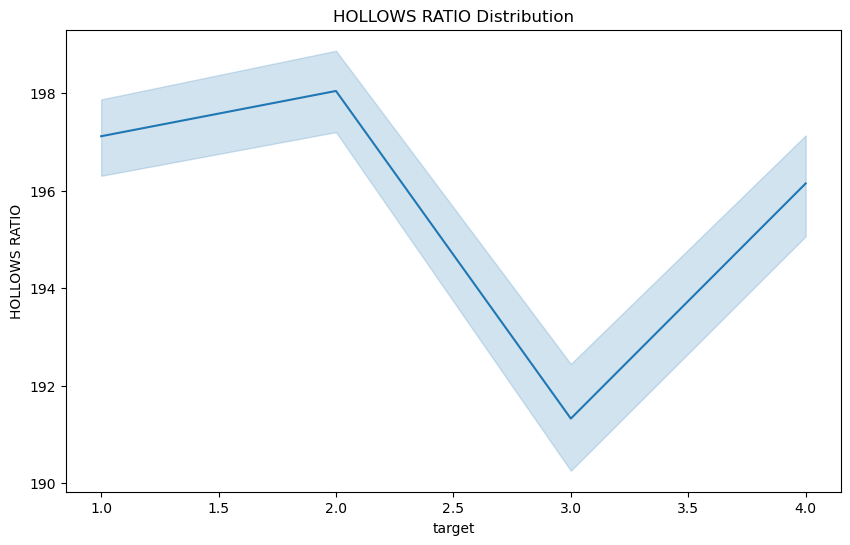

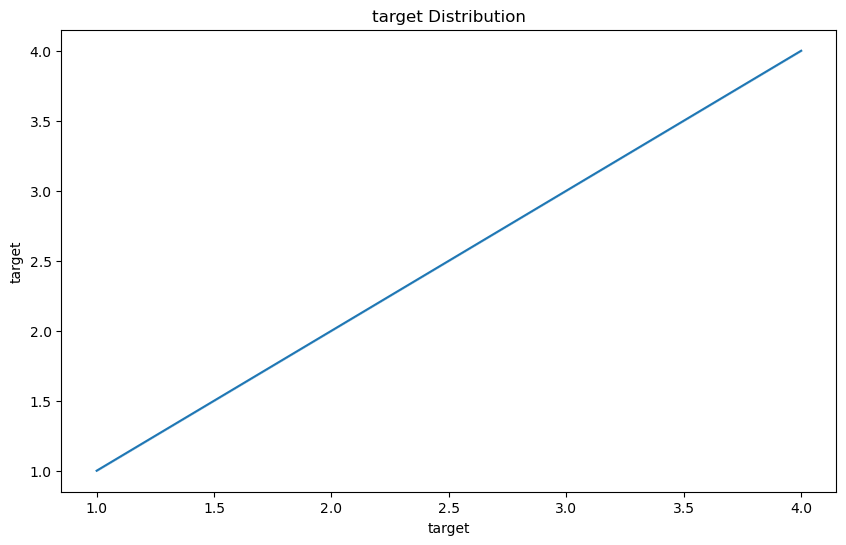

In [20]:
for var in dataset:
    plt.figure(figsize=(10, 6))
    sns.lineplot(data=dataset, x='target', y=var)
    plt.title(f"{var} Distribution")
    plt.xlabel("target")
    plt.ylabel(var)
    plt.show()

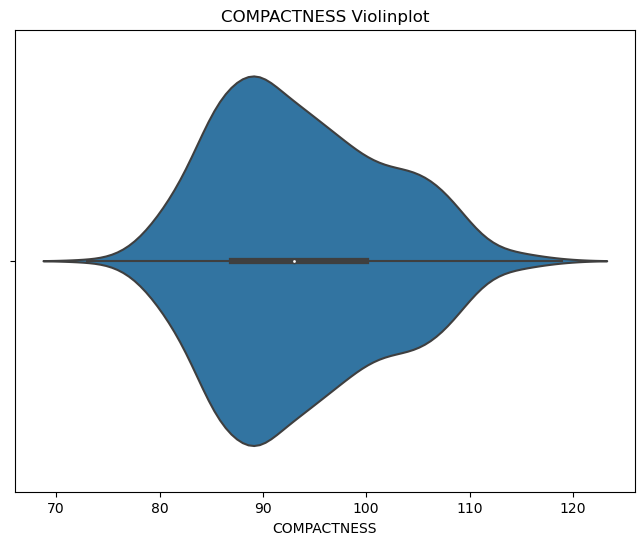

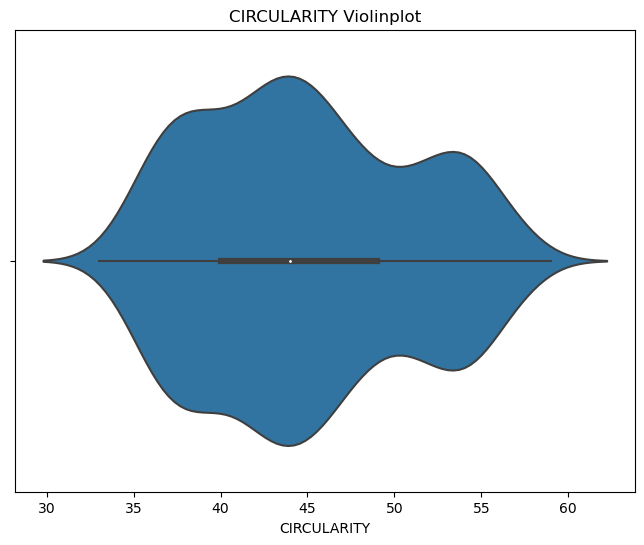

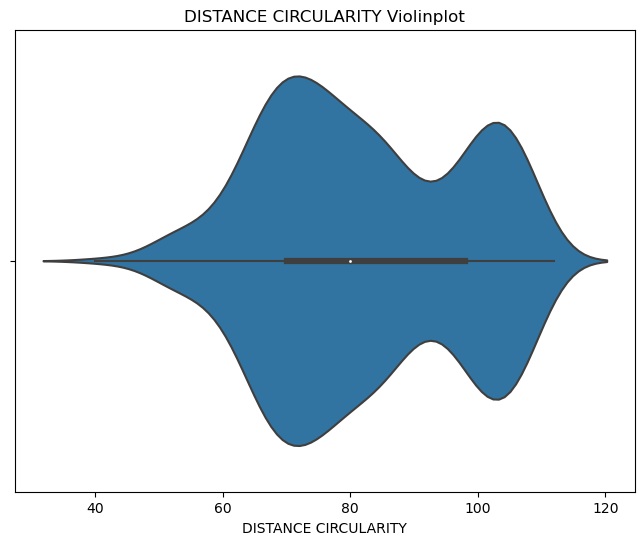

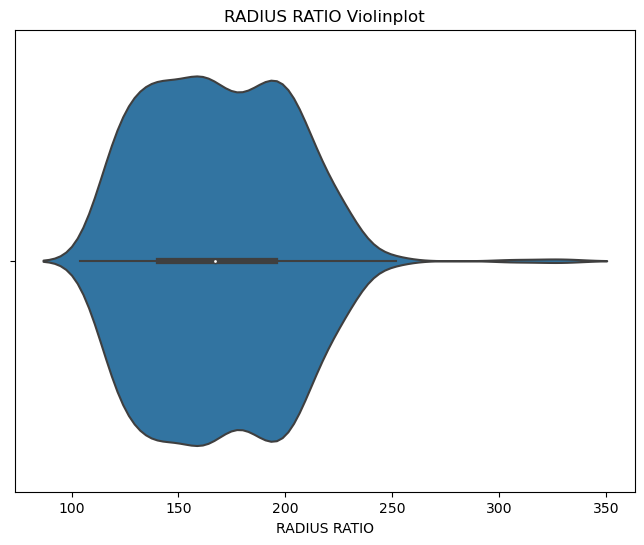

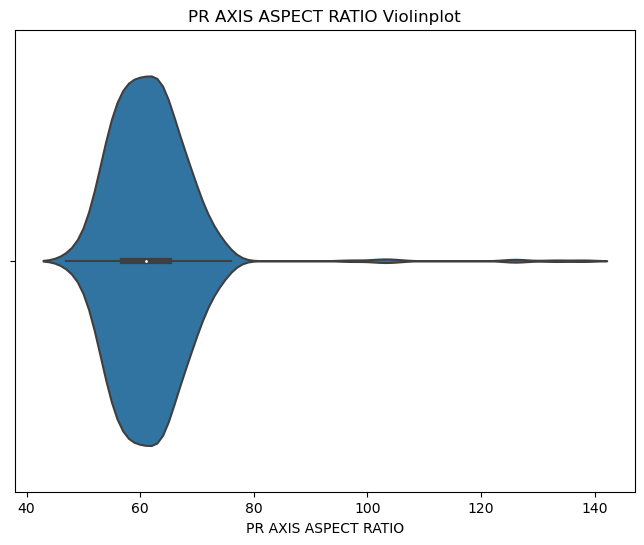

...

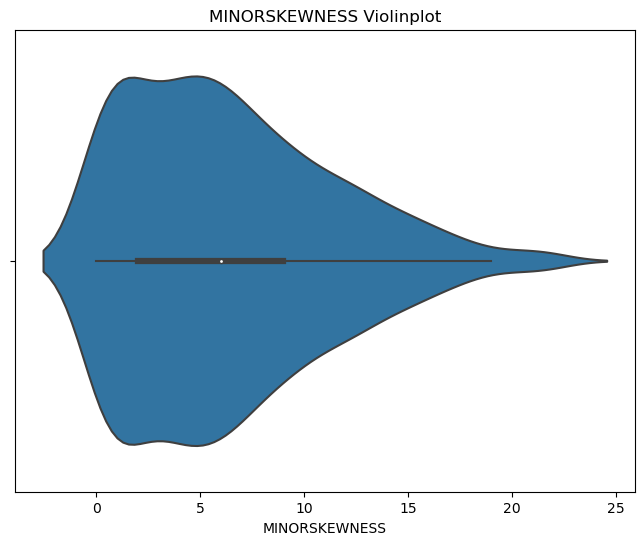

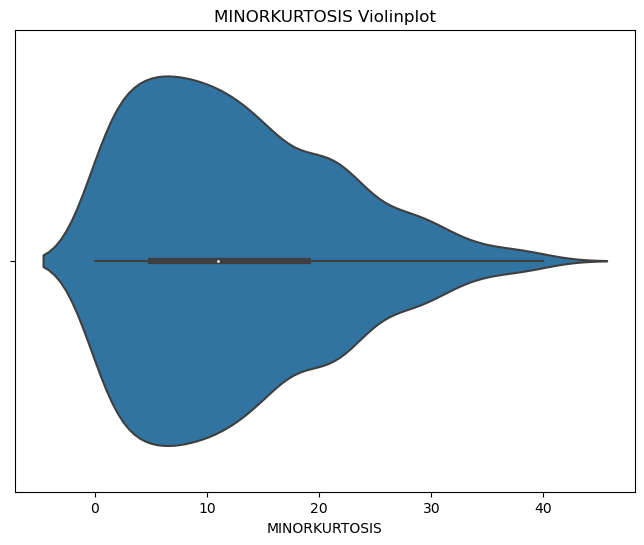

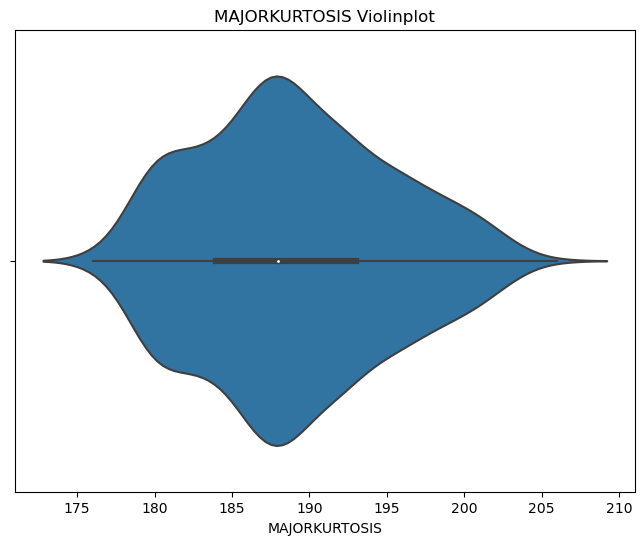

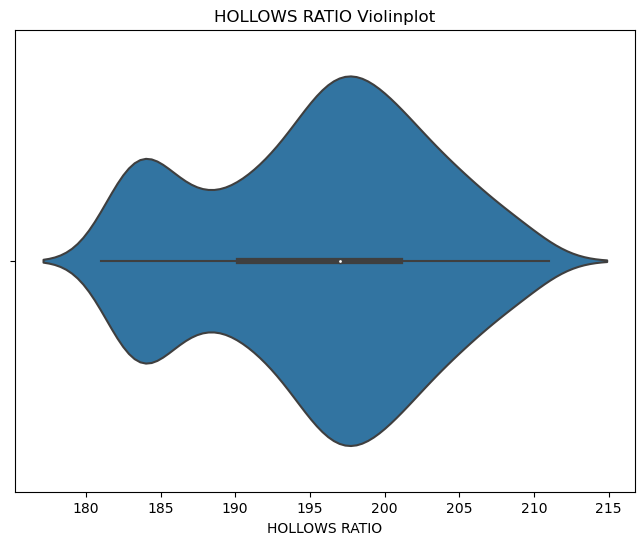

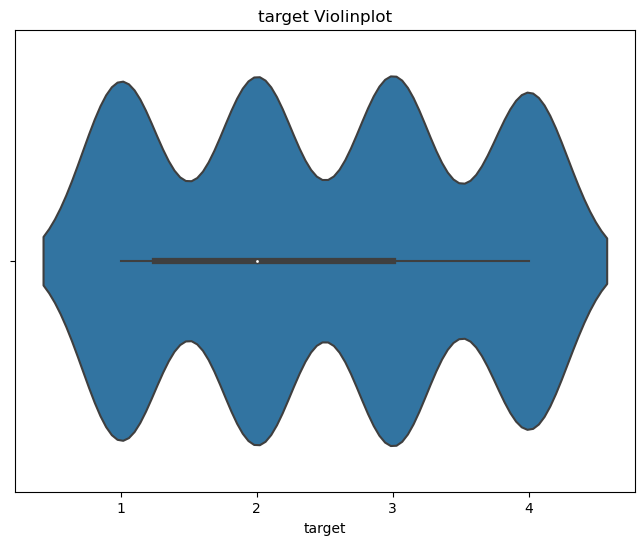

In [21]:
# It is used to show the distribution, density and median value of the data set.
# Veri setinin dağılımını, yoğunluğunu ve medyan değerini göstermek için kullanılır.

# Draw violinplot
for var in dataset:
    plt.figure(figsize=(8, 6))
    sns.violinplot(x=var, data=dataset)
    plt.title(f"{var} Violinplot")
    plt.show()

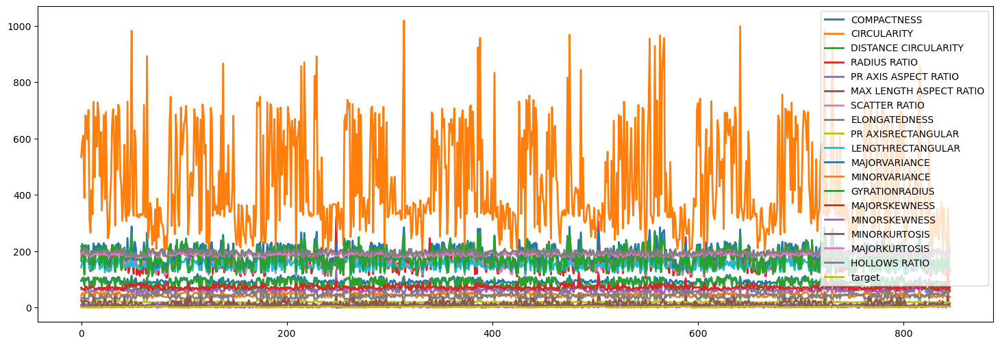

In [22]:
dataset.plot(figsize=(18,6), linewidth=2).legend(loc='upper right')

# Pre-Processing

We check the missing data of each cell with the "isnull()" function. Then we calculate the number of missing values with the sum() function. This way we can display the number of missing values in each column.

"isnull()" fonksiyonu ile her hücrenin eksik olan verilerini kontrol ediyoruz. Ardından sum() fonksiyonu ile eksik değer sayısını hesaplıyoruz. Bu şekilde her sütundaki eksik değer sayısını görüntüleyebiliriz.

In [23]:
# Checking for missing values
missing_values = dataset.isnull().sum()
print(missing_values)

COMPACTNESS                0
CIRCULARITY                0
DISTANCE CIRCULARITY       0
RADIUS RATIO               0
PR AXIS ASPECT RATIO       0
MAX LENGTH ASPECT RATIO    0
SCATTER RATIO              0
ELONGATEDNESS              0
PR AXISRECTANGULAR         0
LENGTHRECTANGULAR          0
MAJORVARIANCE              0
MINORVARIANCE              0
GYRATIONRADIUS             0
MAJORSKEWNESS              0
MINORSKEWNESS              0
MINORKURTOSIS              0
MAJORKURTOSIS              0
HOLLOWS RATIO              0
target                     0
dtype: int64


In [24]:
pip install missingno

Note: you may need to restart the kernel to use updated packages.


<AxesSubplot:>

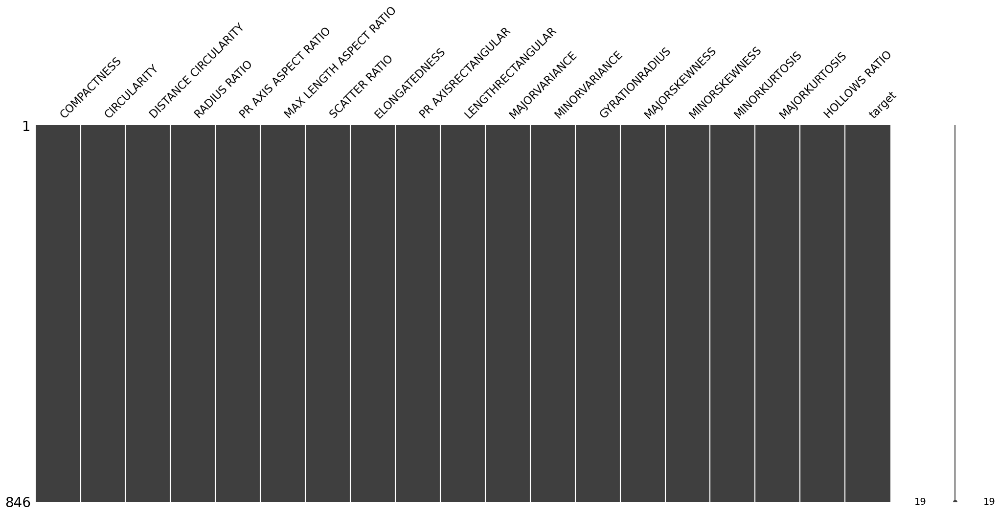

In [25]:
import missingno as msno
msno.matrix(dataset)

We can use the "fillna()" and "dropna()" functions to fill or remove rows or columns with missing values.

Eksik değerlerin olduğu satırları ya da sütunları doldurma veya kaldırma işlemleri için ise "fillna()" ve "dropna()" fonksiyonlarını kullanabiliriz.

In [26]:
# We don't have to use these functions because there is no data missing in the data set.
# Veri setinde eksik veri olmadığı için bu fonksiyonları kullanmak zorunda değiliz.

dataset.dropna(axis=0, inplace= True)

# Filling the missing values in the columns with the average
dataset['COMPACTNESS'].fillna(dataset['COMPACTNESS'].mean(), inplace=True)

# Filling missing values in columns with median
dataset['COMPACTNESS'].fillna(dataset['COMPACTNESS'].median(), inplace=True)

# Filling the missing values in the columns with the most frequently used value
dataset['COMPACTNESS'].fillna(dataset['COMPACTNESS'].mode()[0], inplace=True)


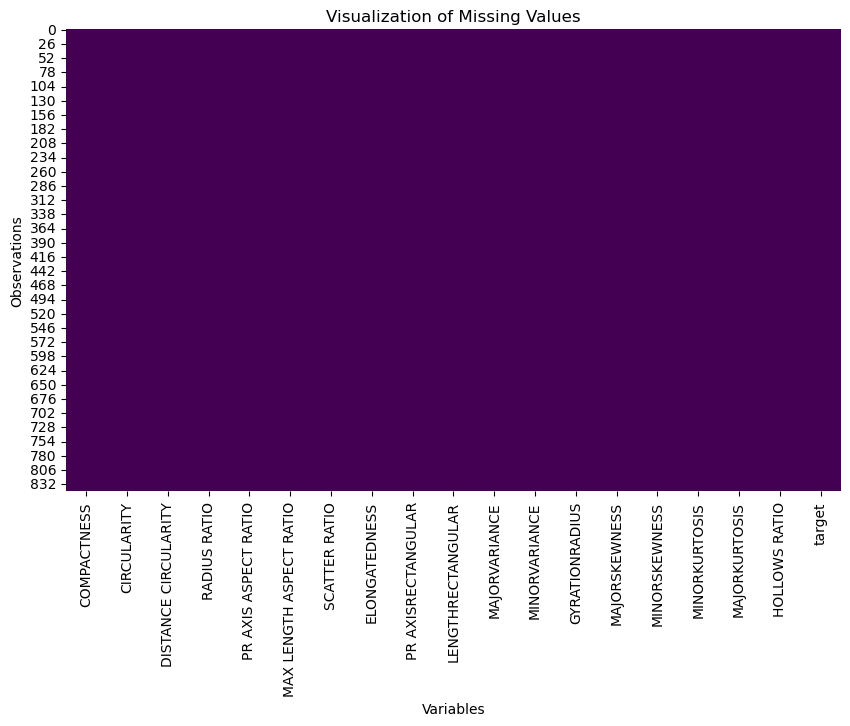

In [27]:
# Visualization of missing values
plt.figure(figsize=(10, 6))
plt.title("Visualization of Missing Values")
sns.heatmap(dataset.isnull(), cmap='viridis', cbar=False)
plt.xlabel("Variables")
plt.ylabel("Observations")
plt.show()

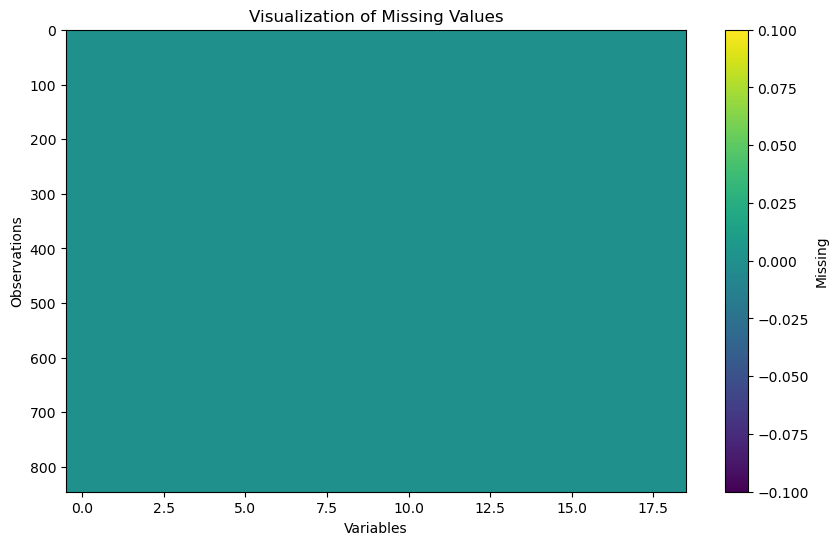

In [28]:
# Visualization of missing values
plt.figure(figsize=(10, 6))
plt.title("Visualization of Missing Values")
plt.imshow(dataset.isnull(), cmap='viridis', aspect='auto')
plt.xlabel("Variables")
plt.ylabel("Observations")
plt.colorbar(label="Missing")
plt.show()

In the code, we draw a box plot using the seaborn library. The boxplot is a commonly used method for visualizing outliers. A box is drawn for each column and outliers are represented by dots.

Kodda, seaborn kütüphanesini kullanarak kutu grafiği (box plot) çiziyoruz. Kutu grafiği, aykırı değerleri görselleştirmek için yaygın olarak kullanılan bir yöntemdir. Her sütun için bir kutu çizilir ve aykırı değerler noktalarla temsil edilir.

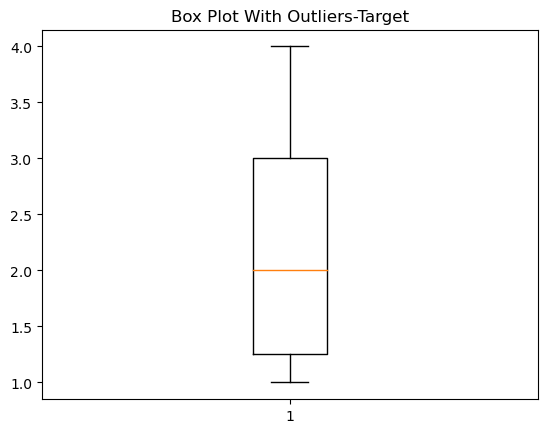

In [29]:
# Create a box plot to visualize outliers for target
plt.boxplot(dataset.target)
plt.title("Box Plot With Outliers-Target")
plt.show()

C:\Users\dogan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


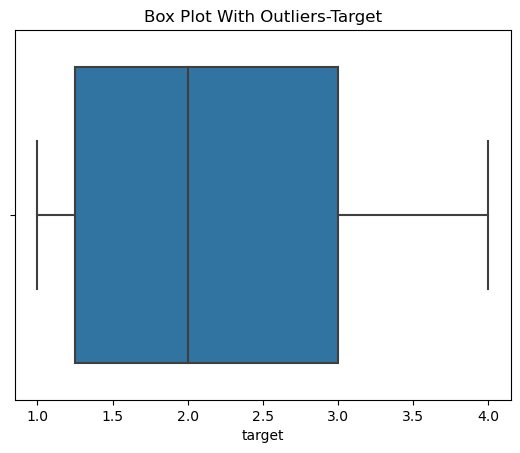

In [30]:
sns.boxplot(dataset.target)
plt.title("Box Plot With Outliers-Target")
plt.show()

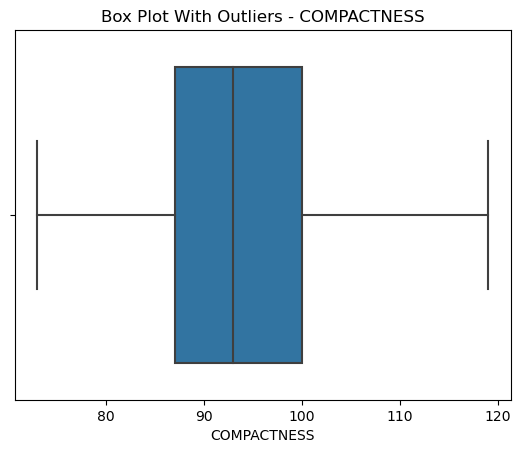

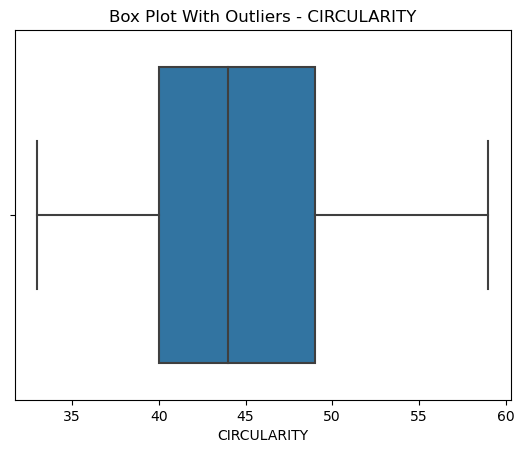

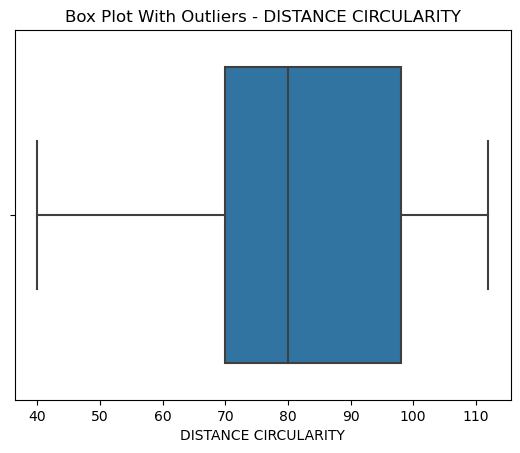

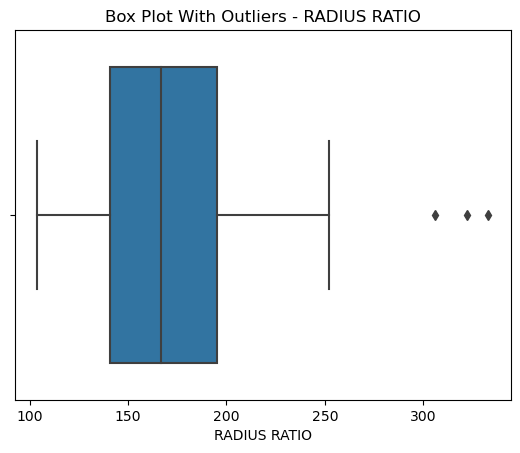

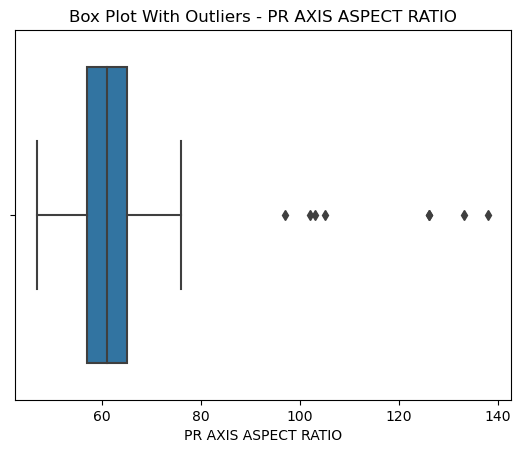

...

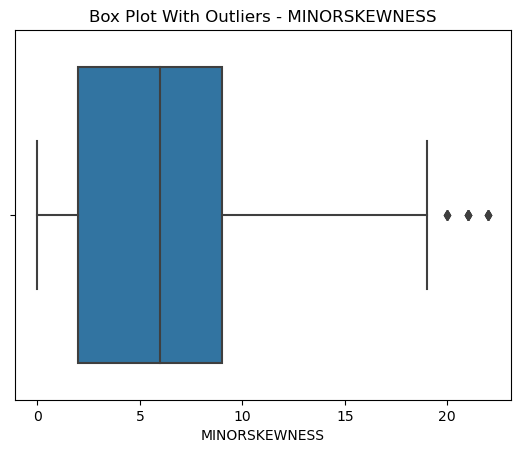

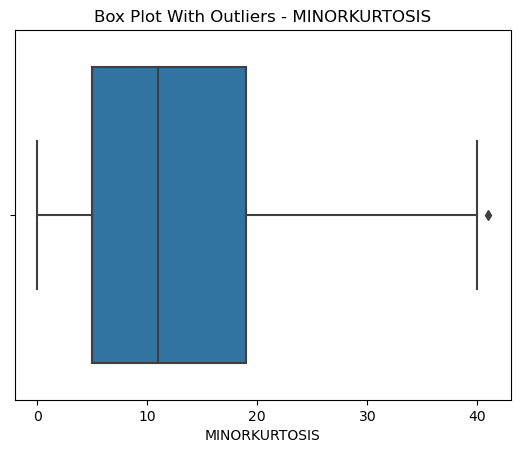

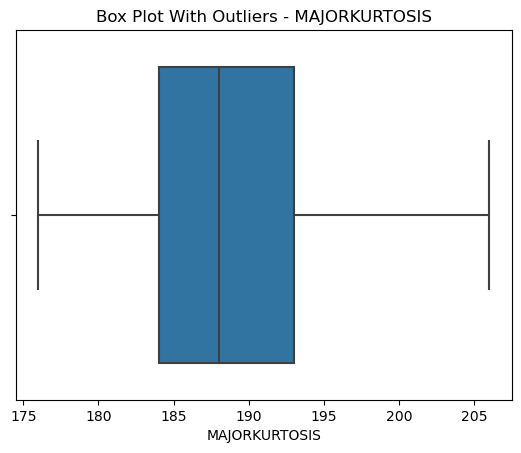

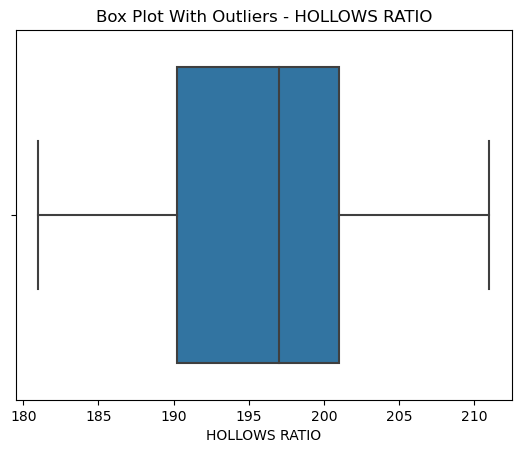

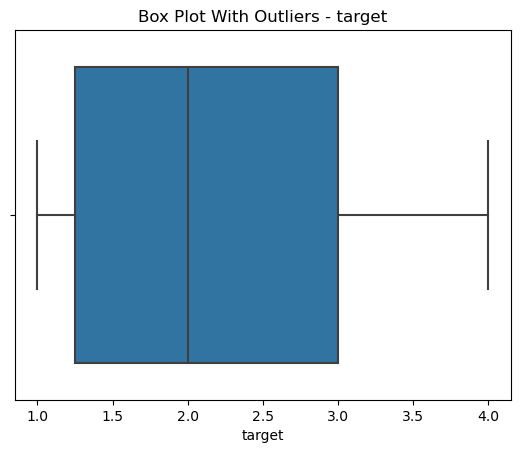

In [31]:
# Draw box plot for each column separately
for column in dataset.columns:
    sns.boxplot(x=dataset[column])
    plt.title("Box Plot With Outliers - "+column)
    plt.show()

We can use encoding methods to convert categorical values to numeric values. For example, we can convert nominal categorical variables with one-hot encoding or label encoding.
1. encoded_data = pd.get_dummies(dataset.target)
2. label_encoder = LabelEncoder()
3. dataset.target = label_encoder.fit_transform(dataset.target)

But we don't need such a thing in this dataset.

Kategorik değerleri sayısal değerlere dönüştürmek için kodlama yöntemlerini kullanabilirsiniz. Örneğin, nominal kategorik değişkenleri one-hot encoding veya label encoding yöntemleriyle dönüştürebilirsiniz.
1. encoded_data = pd.get_dummies(dataset.target)
2. label_encoder = LabelEncoder()
3. dataset.target = label_encoder.fit_transform(dataset.target)

Ama bizim bu veri setinde böyle bir şeye ihtiyaçımız yok.

We can use the duplicated() function to detect duplicate rows in your dataset. This function returns a boolean (True/False) series indicating whether each row is repeated.
We can use the drop_duplicates() function to remove duplicate rows. This function removes duplicate rows from the dataset and returns a cleaned dataset.
After removing duplicate rows, we can check the cleaned dataset.

Veri setinizdeki yinelenen satırları tespit etmek için duplicated() fonksiyonunu kullanabilirsiniz. Bu fonksiyon, her bir satırın yinelenip yinelenmediğini belirten bir boolean (True/False) serisi döndürür.
Yinelenen satırları kaldırmak için drop_duplicates() fonksiyonunu kullanabilirsiniz. Bu fonksiyon, yinelenen satırları veri setinden kaldırır ve temizlenmiş bir veri seti döndürür.
Yinelenen satırları kaldırdıktan sonra, temizlenmiş veri setini kontrol edebiliriz.

In [32]:
# Detecting duplicate rows
duplicated_rows = dataset.duplicated()
duplicated_count = duplicated_rows.sum()

print("Total Duplicate Rows:", duplicated_count)

Total Duplicate Rows: 0


In [33]:
# Remove duplicate rows
dataset = dataset.drop_duplicates()

# Checking the cleaned dataset
print("Cleaned Dataset Row Count:", len(dataset))

Cleaned Dataset Row Count: 846


# ---------------------------------------------------------------------------------------------------------------

# Correlation

Heatmaps are often used to visualize the correlation matrix. The correlation matrix shows the relationships between the variables with a color scale. High positive correlations are shown in darker color while high negative correlations are shown in lighter color.

Korelasyon matrisini görselleştirmek için genellikle ısı haritaları (heatmap) kullanılır. Korelasyon matrisi, değişkenler arasındaki ilişkileri renk skalasıyla gösterir. Yüksek pozitif korelasyonlar daha koyu renkte gösterilirken, yüksek negatif korelasyonlar daha açık renkte gösterilir.

In [34]:
data_corr =dataset.corr()
data_corr

,COMPACTNESS,CIRCULARITY,DISTANCE CIRCULARITY,RADIUS RATIO,PR AXIS ASPECT RATIO,MAX LENGTH ASPECT RATIO,SCATTER RATIO,ELONGATEDNESS,PR AXISRECTANGULAR,LENGTHRECTANGULAR,MAJORVARIANCE,MINORVARIANCE,GYRATIONRADIUS,MAJORSKEWNESS,MINORSKEWNESS,MINORKURTOSIS,MAJORKURTOSIS,HOLLOWS RATIO,target
COMPACTNESS,1.000000,0.692869,0.792444,0.691659,0.093222,0.148249,0.813003,-0.788647,0.813437,0.676143,0.764415,0.818632,0.585347,-0.252984,0.233693,0.156779,0.297780,0.365552,-0.258411
CIRCULARITY,0.692869,1.000000,0.798492,0.622778,0.149692,0.247467,0.860367,-0.828755,0.857925,0.965776,0.808496,0.852679,0.936080,0.058669,0.148433,-0.015482,-0.113047,0.038677,-0.248088
DISTANCE CIRCULARITY,0.792444,0.798492,1.000000,0.771644,0.161529,0.264309,0.907280,-0.912307,0.895326,0.774524,0.864432,0.889661,0.705818,-0.231660,0.116478,0.264522,0.147980,0.335453,-0.416665
RADIUS RATIO,0.691659,0.622778,0.771644,1.000000,0.665407,0.448048,0.738460,-0.792557,0.711497,0.570154,0.797588,0.725781,0.539069,-0.182412,0.050534,0.174299,0.380757,0.469278,-0.375177
PR AXIS ASPECT RATIO,0.093222,0.149692,0.161529,0.665407,1.000000,0.648096,0.106064,-0.185086,0.079982,0.129168,0.274705,0.092182,0.124408,0.152304,-0.056807,-0.034180,0.238195,0.267381,0.051517
MAX LENGTH ASPECT RATIO,0.148249,0.247467,0.264309,0.448048,0.648096,1.000000,0.166769,-0.180044,0.161861,0.305943,0.319430,0.144606,0.189791,0.294548,0.015218,0.043379,-0.027317,0.143919,0.012975
SCATTER RATIO,0.813003,0.860367,0.907280,0.738460,0.106064,0.166769,1.000000,-0.973385,0.992088,0.810648,0.951862,0.996318,0.800932,-0.028618,0.074347,0.210706,0.004053,0.119950,-0.432469
ELONGATEDNESS,-0.788647,-0.828755,-0.912307,-0.792557,-0.185086,-0.180044,-0.973385,1.000000,-0.950512,-0.775531,-0.938392,-0.956522,-0.766146,0.104875,-0.053346,-0.185189,-0.112046,-0.216725,0.446360
PR AXISRECTANGULAR,0.813437,0.857925,0.895326,0.711497,0.079982,0.161861,0.992088,-0.950512,1.000000,0.813305,0.938266,0.992346,0.798282,-0.016333,0.082346,0.213088,-0.022056,0.098519,-0.418447
LENGTHRECTANGULAR,0.676143,0.965776,0.774524,0.570154,0.129168,0.305943,0.810648,-0.775531,0.813305,1.000000,0.747152,0.798071,0.866479,0.040339,0.137473,0.001183,-0.107718,0.076770,-0.154881


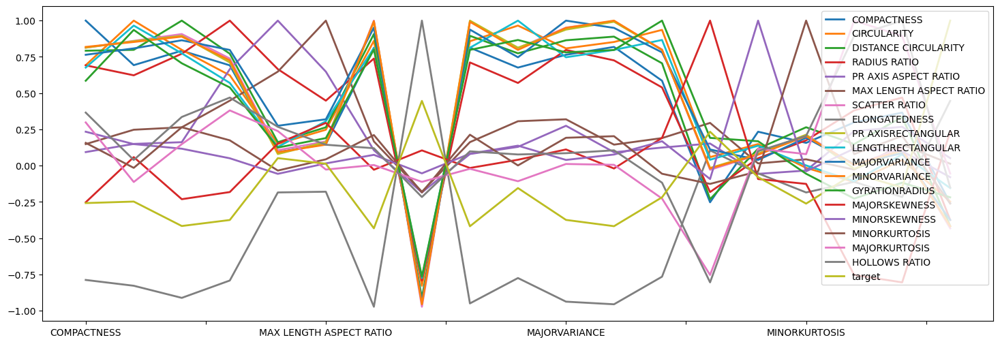

In [35]:
data_corr.plot(figsize=(18,6), linewidth=2).legend(loc='upper right')

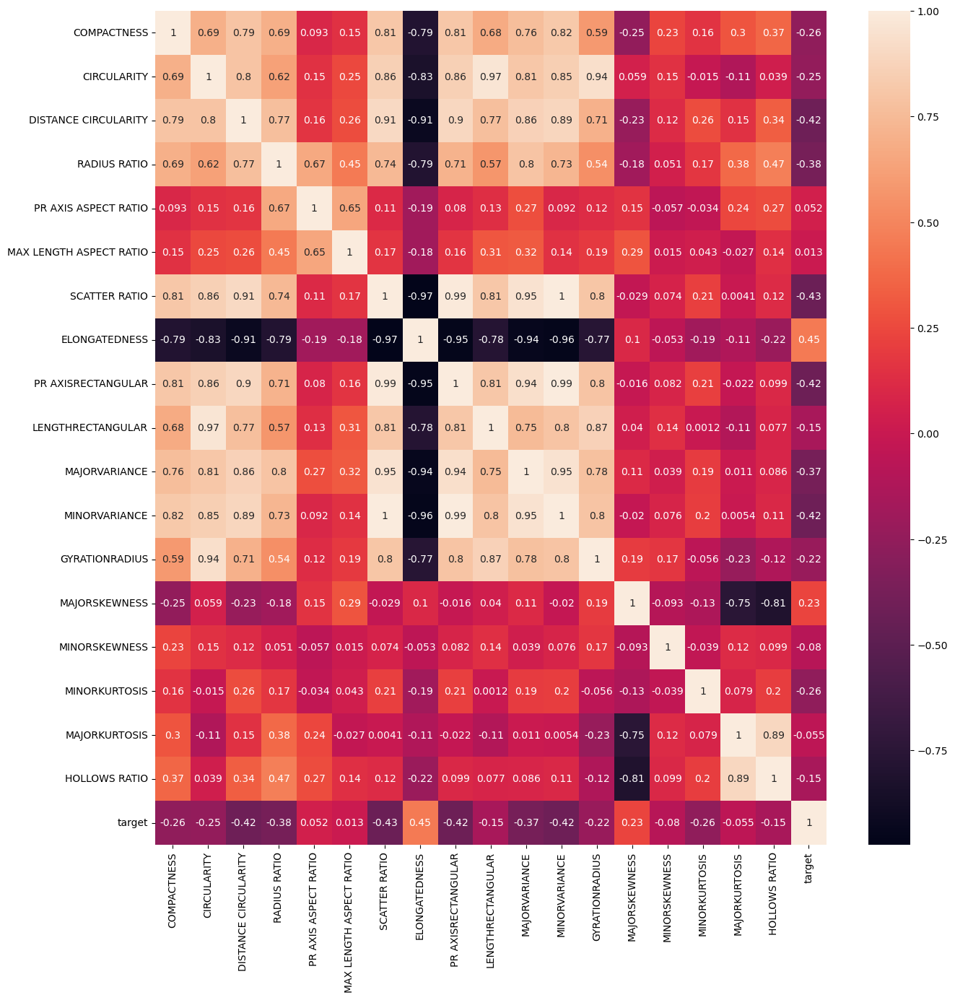

In [36]:
plt.figure(figsize = (15,15))
sns.heatmap(data_corr, annot=True)
plt.show()

# ---------------------------------------------------------------------------------------------------------------

# Machine Learning Algorithms

In [37]:
# Separating the data set into dependent and independent variables
X = dataset.iloc[:, : 18]
y = dataset.iloc[:, 18] # target

In [38]:
print(y)

0      1
1      1
2      1
3      1
4      1
      ..
841    4
842    4
843    4
844    4
845    4
Name: target, Length: 846, dtype: int64


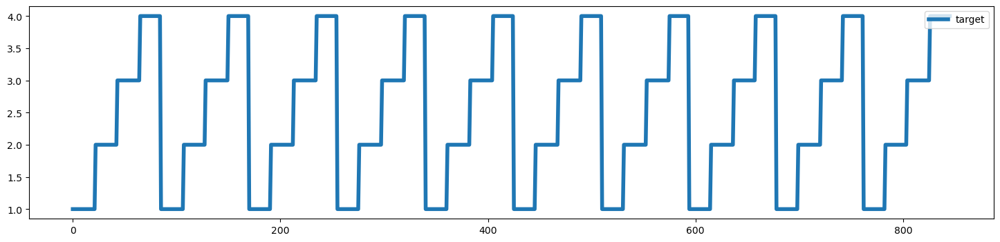

In [39]:
y.plot(figsize=(18,4), linewidth=4).legend(loc='upper right')

In [40]:
X.corr()

,COMPACTNESS,CIRCULARITY,DISTANCE CIRCULARITY,RADIUS RATIO,PR AXIS ASPECT RATIO,MAX LENGTH ASPECT RATIO,SCATTER RATIO,ELONGATEDNESS,PR AXISRECTANGULAR,LENGTHRECTANGULAR,MAJORVARIANCE,MINORVARIANCE,GYRATIONRADIUS,MAJORSKEWNESS,MINORSKEWNESS,MINORKURTOSIS,MAJORKURTOSIS,HOLLOWS RATIO
COMPACTNESS,1.000000,0.692869,0.792444,0.691659,0.093222,0.148249,0.813003,-0.788647,0.813437,0.676143,0.764415,0.818632,0.585347,-0.252984,0.233693,0.156779,0.297780,0.365552
CIRCULARITY,0.692869,1.000000,0.798492,0.622778,0.149692,0.247467,0.860367,-0.828755,0.857925,0.965776,0.808496,0.852679,0.936080,0.058669,0.148433,-0.015482,-0.113047,0.038677
DISTANCE CIRCULARITY,0.792444,0.798492,1.000000,0.771644,0.161529,0.264309,0.907280,-0.912307,0.895326,0.774524,0.864432,0.889661,0.705818,-0.231660,0.116478,0.264522,0.147980,0.335453
RADIUS RATIO,0.691659,0.622778,0.771644,1.000000,0.665407,0.448048,0.738460,-0.792557,0.711497,0.570154,0.797588,0.725781,0.539069,-0.182412,0.050534,0.174299,0.380757,0.469278
PR AXIS ASPECT RATIO,0.093222,0.149692,0.161529,0.665407,1.000000,0.648096,0.106064,-0.185086,0.079982,0.129168,0.274705,0.092182,0.124408,0.152304,-0.056807,-0.034180,0.238195,0.267381
MAX LENGTH ASPECT RATIO,0.148249,0.247467,0.264309,0.448048,0.648096,1.000000,0.166769,-0.180044,0.161861,0.305943,0.319430,0.144606,0.189791,0.294548,0.015218,0.043379,-0.027317,0.143919
SCATTER RATIO,0.813003,0.860367,0.907280,0.738460,0.106064,0.166769,1.000000,-0.973385,0.992088,0.810648,0.951862,0.996318,0.800932,-0.028618,0.074347,0.210706,0.004053,0.119950
ELONGATEDNESS,-0.788647,-0.828755,-0.912307,-0.792557,-0.185086,-0.180044,-0.973385,1.000000,-0.950512,-0.775531,-0.938392,-0.956522,-0.766146,0.104875,-0.053346,-0.185189,-0.112046,-0.216725
PR AXISRECTANGULAR,0.813437,0.857925,0.895326,0.711497,0.079982,0.161861,0.992088,-0.950512,1.000000,0.813305,0.938266,0.992346,0.798282,-0.016333,0.082346,0.213088,-0.022056,0.098519
LENGTHRECTANGULAR,0.676143,0.965776,0.774524,0.570154,0.129168,0.305943,0.810648,-0.775531,0.813305,1.000000,0.747152,0.798071,0.866479,0.040339,0.137473,0.001183,-0.107718,0.076770


#  --------------------------------------------------------------------------------------------------------------

# Linear Regression

EN

Linear Regression is a supervised machine learning algorithm used to predict a continuous target variable based on one or more input features. It assumes a linear relationship between the input features and the target variable. The goal of linear regression is to find the best-fitting line that minimizes the difference between the predicted values and the actual values.

The algorithm works by estimating the coefficients (slope and intercept) of the linear equation that represents the relationship between the input features and the target variable. This estimation is done using a method called Ordinary Least Squares (OLS), which minimizes the sum of the squared differences between the predicted and actual values.

To visualize the linear regression model, you can plot the scatter plot of the data points and overlay the regression line. This helps in understanding the relationship between the input features and the target variable. The scatter plot displays the data points as dots, and the regression line shows the best-fit line that represents the linear relationship.

TR

Lineer Regresyon, bir veya daha fazla girdi özelliğine dayanarak sürekli bir hedef değişkeni tahmin etmek için kullanılan denetimli bir makine öğrenimi algoritmasıdır. Girdi özellikleri ile hedef değişkeni arasında doğrusal bir ilişki varsayılır. Lineer regresyonun amacı, tahmin edilen değerler ile gerçek değerler arasındaki farkı en aza indiren en iyi uyan doğruyu bulmaktır.

Algoritma, girdi özellikleri ile hedef değişkeni arasındaki ilişkiyi temsil eden doğrusal denklemin katsayılarını (eğim ve kesme noktası) tahmin eder. Bu tahmin, Tahmin edilen ve gerçek değerler arasındaki karelerin toplamını en aza indiren Ordinary Least Squares (OLS) yöntemi kullanılarak yapılır.

Lineer regresyon modelini görselleştirmek için, veri noktalarının saçılım grafiğini çizebilir ve regresyon doğrusunu üzerine yerleştirebilirsiniz. Bu, girdi özellikleri ile hedef değişkeni arasındaki ilişkiyi anlamada yardımcı olur. Saçılım grafiği, veri noktalarını noktalar olarak gösterirken, regresyon doğrusu doğrusal ilişkiyi temsil eder.

In [41]:
# Splitting the dataset into the Training set and Test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

In [42]:
# Fitting Simple Linear Regression for the Training set
linearRegression = LinearRegression()
linearRegression.fit(X_train, y_train)

LinearRegression()

In [43]:
print("Linear Regression Score: ", linearRegression.score(X_train, y_train))

Linear Regression Score:  0.6238903384819202


Modelin katsayıları (coefficients) elde edilir. linearRegression.coef_ ifadesiyle katsayılar çekilir ve coefficientDataframe isimli bir DataFrame'e aktarılır.

In [44]:
# Obtaining the coefficients of the Linear Regression model
linearRegression.coef_

array([ 0.06643063, -0.2523524 ,  0.04070547, -0.05705134,  0.15348906,
       -0.05548806, -0.1103426 , -0.06751254, -0.11321231,  0.10894954,
        0.0049824 ,  0.01660453,  0.01267558,  0.02668012, -0.0338604 ,
       -0.00161687,  0.07918771, -0.02766653])

In [45]:
coefficientDataframe = pd.DataFrame(linearRegression.coef_, X.columns, columns=['Coefficient'])
coefficientDataframe.sort_values(by="Coefficient")

,Coefficient
CIRCULARITY,-0.252352
PR AXISRECTANGULAR,-0.113212
SCATTER RATIO,-0.110343
ELONGATEDNESS,-0.067513
RADIUS RATIO,-0.057051
MAX LENGTH ASPECT RATIO,-0.055488
MINORSKEWNESS,-0.033860
HOLLOWS RATIO,-0.027667
MINORKURTOSIS,-0.001617
MAJORVARIANCE,0.004982


In [46]:
# Making predictions on the training dataset
y_train_pred = linearRegression.predict(X_train)

# Making predictions on the test dataset
y_test_pred = linearRegression.predict(X_test)

# Calculating training and test error values
train_error = y_train - y_train_pred
test_error = y_test - y_test_pred

In the code, we combine the training and test error values and assign them to the all_errors variable. Next, we plot the distribution of error values as a histogram using the plt.hist() function.

Kodda, eğitim ve test hata değerlerini birleştirerek all_errors değişkenine atıyoruz. Ardından, plt.hist() fonksiyonunu kullanarak hata değerlerinin dağılımını histogram olarak çizdiriyoruz.

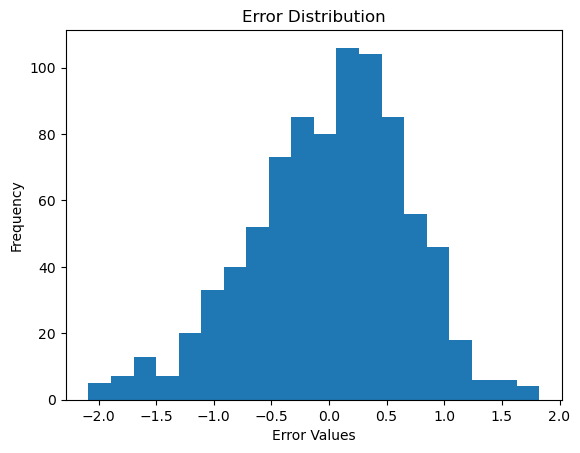

In [47]:
# Combining training and test error values
all_errors = pd.concat([train_error, test_error])

# Visualizing the error distribution with a histogram
plt.hist(all_errors, bins=20)
plt.xlabel("Error Values")
plt.ylabel("Frequency")
plt.title("Error Distribution")
plt.show()

In this code, we combine the actual values with the predicted values and assign them to the variables y_combined and y_pred_combined. Next, we plot a scatter plot comparing the actual and predicted values using the plt.scatter() function.

Bu kodda, gerçek değerler ile tahmin edilen değerleri birleştirerek y_combined ve y_pred_combined değişkenlerine atıyoruz. Sonra, plt.scatter() fonksiyonunu kullanarak gerçek ve tahmin edilen değerleri karşılaştıran bir scatter plot çizdiriyoruz.

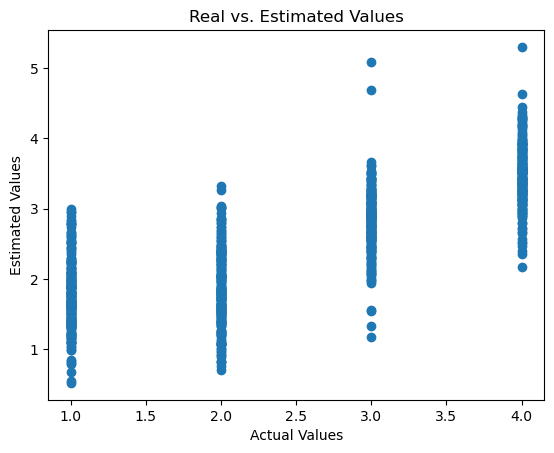

In [48]:
# Combining actual and predicted values
y_combined = np.concatenate([y_train, y_test])
y_pred_combined = np.concatenate([y_train_pred, y_test_pred])

# Comparing actual and predicted values
plt.scatter(y_combined, y_pred_combined)
plt.xlabel("Actual Values")
plt.ylabel("Estimated Values")
plt.title("Real vs. Estimated Values")
plt.show()

In this code, we calculate errors between actual and predicted values using error metrics such as mean_absolute_error(), mean_squared_error(), and r2_score(). Next, we print these error metrics to the screen.

Bu kodda, mean_absolute_error(), mean_squared_error(), ve r2_score() gibi hata metriklerini kullanarak gerçek ve tahmin edilen değerler arasındaki hataları hesaplıyoruz. Sonrasında, bu hata metriklerini ekrana yazdırıyoruz.

In [49]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Calculating error metrics
mae = mean_absolute_error(y_test, y_test_pred)
mse = mean_squared_error(y_test, y_test_pred)
r2 = r2_score(y_test, y_test_pred)

print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("R^2 Score:", r2)

Mean Absolute Error (MAE): 0.5986301500793557
Mean Squared Error (MSE): 0.5068113549575929
R^2 Score: 0.6124044521348955


In [50]:
# Polinomiyal Regresyon
from sklearn.preprocessing import PolynomialFeatures

poly = PolynomialFeatures(degree=2)
X_poly_train = poly.fit_transform(X_train)
linearRegression.fit(X_poly_train, y_train)

print("Linear Regression Score with Polinomiyal Regresyon: ", linearRegression.score(X_poly_train, y_train))

Linear Regression Score with Polinomiyal Regresyon:  0.8828604527082493


# ---------------------------------------------------------------------------------------------------------------

# Cross Validate

Cross-validation is a method used to evaluate the performance of a model.

Cross-validation, bir modelin performansını değerlendirmek için kullanılan bir yöntemdir. 

In [51]:
result = cross_validate(linearRegression, X, y, cv=10, scoring="neg_mean_absolute_error", return_train_score=True)
print(result["test_score"])
print(result["train_score"])

[-0.5536068  -0.56079947 -0.55600777 -0.6020446  -0.48551228 -0.52303626
 -0.57681187 -0.60383364 -0.5365496  -0.55917286]
[-0.54102034 -0.53893559 -0.54120476 -0.5353337  -0.5473775  -0.5418599
 -0.53890308 -0.5338429  -0.54155803 -0.53631178]


In [52]:
result

{'fit_time': array([0.00399613, 0.00199914, 0.00300145, 0.00300074, 0.00299907,
        0.00199819, 0.00202918, 0.00200319, 0.0009985 , 0.00200415]),
 'score_time': array([0.00199914, 0.00200057, 0.00099969, 0.00100136, 0.00100088,
        0.00200033, 0.0009706 , 0.00099993, 0.00199866, 0.00099826]),
 'test_score': array([-0.5536068 , -0.56079947, -0.55600777, -0.6020446 , -0.48551228,
        -0.52303626, -0.57681187, -0.60383364, -0.5365496 , -0.55917286]),
 'train_score': array([-0.54102034, -0.53893559, -0.54120476, -0.5353337 , -0.5473775 ,
        -0.5418599 , -0.53890308, -0.5338429 , -0.54155803, -0.53631178])}

In [53]:
# r-Square error
result1 = cross_validate(linearRegression, X, y, cv=10, scoring="r2", return_train_score=True)
print(result1["test_score"])
print(result1["train_score"])

[0.6395224  0.61886436 0.63546029 0.55870378 0.68232052 0.63392282
 0.52419775 0.52018114 0.5955068  0.5459554 ]
[0.62121946 0.62400049 0.62147094 0.62999762 0.61712805 0.62164725
 0.63234924 0.63404496 0.62506189 0.62713857]


In [54]:
# root mean square error
result2=cross_validate(linearRegression, X, y, cv=10, scoring="neg_root_mean_squared_error", return_train_score=True)
print(result2["test_score"])
print(result2["train_score"])

[-0.66786545 -0.68673569 -0.66535329 -0.73205716 -0.62111851 -0.6667549
 -0.7559687  -0.76686199 -0.70409971 -0.74611046]
[-0.67959515 -0.67709575 -0.68008495 -0.67238158 -0.68397515 -0.67992655
 -0.67063532 -0.66835322 -0.6765065  -0.67461374]


In [55]:
# mean square log error
result3=cross_validate(linearRegression, X, y, cv=10, scoring="neg_mean_squared_log_error", return_train_score=True)
print(result3["test_score"])
print(result3["train_score"])

[-0.04652988 -0.0539338  -0.0573677  -0.06316128 -0.04649393 -0.04943342
 -0.06200719 -0.06805386 -0.0530871  -0.05268276]
[-0.05311014 -0.05245051 -0.05236551 -0.05153119 -0.05333954 -0.05300794
 -0.05189102 -0.05122863 -0.05255359 -0.05198374]


In [56]:
# median absolute error: he MAD is resistant to outliers. The presence of outliers does not change the value of the MAD
result4=cross_validate(linearRegression, X, y, cv=10, scoring="neg_median_absolute_error", return_train_score=True)
print(result4["test_score"])
print(result4["train_score"])

[-0.49061489 -0.4895294  -0.47599139 -0.51768312 -0.39174353 -0.45675166
 -0.43725429 -0.60807464 -0.43646062 -0.43678501]
[-0.44459551 -0.44815011 -0.45782961 -0.44594122 -0.45876744 -0.4577024
 -0.44884592 -0.44797771 -0.45613786 -0.45623435]


In [57]:
# mean absoulte percentage error
result8=cross_validate(linearRegression, X, y, cv=10, scoring="neg_mean_absolute_percentage_error", return_train_score=True)
print(-1*result8["test_score"])
print(-1*result8["train_score"])

[0.3022452  0.32760467 0.34166921 0.36965027 0.29398759 0.3137568
 0.32030237 0.3680827  0.31386653 0.31438356]
[0.32044833 0.31756272 0.31877629 0.31491291 0.32259306 0.32041089
 0.31768265 0.31448249 0.31961019 0.31610031]


# ---------------------------------------------------------------------------------------------------------------

# KNN

EN

K-Nearest Neighbors (KNN) is a machine learning algorithm used to perform classification or regression based on the closeness measure of data points.

The working principle of the KNN algorithm includes the following steps:
1. Preparing the Dataset and Labels: The dataset is prepared as a matrix (X) containing the features and a vector (y) containing the corresponding labels (classes or target values).
2. Choosing a Distance Metric: To make the KNN algorithm work, a distance metric needs to be selected. Euclidean distance is the most commonly used metric, but other metrics can also be preferred.
3. Creating the Model: The KNN algorithm uses a simple data structure to store the dataset. During the training phase, the algorithm loads the data points into this structure and stores them with their labels.
4. Making Predictions: When a prediction is requested, the KNN algorithm finds the k nearest neighbors of the selected point. By examining the labels of these neighbors, the prediction is made using the majority class or average.

TR

K-Nearest Neighbors (KNN), veri noktalarının yakınlık ölçüsüne dayanarak sınıflandırma veya regresyon yapmak için kullanılan bir makine öğrenmesi algoritmasıdır.

KNN algoritmasının çalışma mantığı şu adımları içerir:
1. Veri Kümesi ve Etiketlerin Hazırlanması: Veri kümesi, özelliklerin bulunduğu bir matris (X) ve bu özelliklere karşılık gelen etiketlerin (sınıfların veya hedef değerlerin) bulunduğu bir vektör (y) olarak hazırlanır.
2. Ölçüm Metriği Belirleme: KNN'nin çalışması için bir ölçüm metriği seçmek gerekmektedir. Öklidyen mesafe (euclidean distance) en sık kullanılan ölçüm metriğidir, ancak başka metrikler de tercih edilebilir.
3. Modelin Oluşturulması: KNN algoritması, veri kümesini depolamak için basit bir yapı kullanır. Eğitim aşamasında, bu yapıya veri noktalarını yükler ve etiketleriyle birlikte saklar.
4. Tahmin Yapma: Bir tahmin yapmak istendiğinde, KNN algoritması seçilen noktanın en yakın k komşularını bulur. Bu komşuların etiketleri incelenerek, çoğunluğun sınıfı veya ortalaması kullanılarak tahmin yapılır.

In [58]:
# Splitting the dataset into the Training set and Test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [59]:
print(len(X_train))
print(len(y_train))
print(len(X_test))
print(len(y_test))

676
676
170
170


In order for the KNN algorithm to be applied correctly, the features are usually scaled so that they have the same scale. This process normalizes the features in the dataset and helps to represent each feature at the same scale.

Doğru bir şekilde KNN algoritması uygulanabilmesi için genellikle öznitelikleri aynı ölçeğe sahip olacak şekilde ölçeklendirme işlemi yapılır. Bu işlem veri setindeki öznitelikleri normalize eder ve her bir özniteliği aynı ölçekte temsil etmeye yardımcı olur.

In [60]:
# Feature scaling
sc_X = StandardScaler()
X_train = sc_X.fit_transform(X_train)
X_test = sc_X.transform(X_test)

In [61]:
import math

sqrt = math.sqrt(676 - 170)
print(sqrt)

22.494443758403985


In [62]:
# Define the model: Init K-NN
classifier = KNeighborsClassifier(n_neighbors=23, metric='euclidean')

In [63]:
# Fit Model
classifier.fit(X_train, y_train)

KNeighborsClassifier(metric='euclidean', n_neighbors=23)

In [64]:
# Predict the test set results
y_pred = classifier.predict(X_test)
y_pred

C:\Users\dogan\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


array([2, 4, 3, 1, 1, 2, 4, 3, 1, 1, 2, 4, 3, 2, 3, 2, 1, 2, 4, 3, 1, 1,
       2, 1, 4, 1, 4, 1, 4, 4, 2, 2, 4, 3, 3, 3, 3, 3, 3, 3, 4, 1, 1, 2,
       4, 3, 4, 3, 1, 1, 3, 3, 1, 4, 3, 2, 4, 4, 3, 1, 3, 1, 2, 4, 4, 3,
       1, 4, 4, 2, 4, 4, 2, 2, 3, 2, 4, 4, 3, 4, 4, 3, 2, 4, 3, 1, 2, 4,
       2, 2, 2, 4, 1, 3, 4, 4, 4, 2, 3, 3, 1, 2, 2, 4, 2, 2, 2, 1, 4, 4,
       1, 3, 2, 1, 3, 3, 2, 3, 1, 1, 2, 3, 4, 1, 2, 3, 2, 3, 4, 3, 3, 4,
       2, 4, 3, 2, 1, 2, 1, 2, 2, 1, 3, 4, 1, 4, 1, 2, 3, 3, 4, 1, 1, 1,
       4, 2, 2, 2, 4, 4, 3, 1, 4, 1, 4, 2, 2, 4, 1, 3], dtype=int64)

In [65]:
cm = confusion_matrix(y_test, y_pred)
print (cm)

[[23 17  1  4]
 [15 26  1  4]
 [ 0  0 34  0]
 [ 0  0  6 39]]


In [66]:
# Calculating performance metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='micro')
recall = recall_score(y_test, y_pred, average='micro')
f1 = f1_score(y_test, y_pred, average='micro')

In [67]:
print("Accuracy Score:", accuracy)
print("Precision Score:", precision)
print("Recall Score:", recall)
print("F1 Score:", f1)

Accuracy Score: 0.7176470588235294
Precision Score: 0.7176470588235294
Recall Score: 0.7176470588235294
F1 Score: 0.7176470588235294


# -Comment-

EN
1. The accuracy score, precision score, recall score, and F1 score we provided are all the same, with a value of 0.7176470588235294.
2. This indicates that the KNN model achieved an overall accuracy of approximately 71.76%. The precision, recall, and F1 scores are also 71.76%.
3. In general, having all scores at the same value suggests that the model's performance is consistent across different evaluation metrics.

TR
1. Sağladığımız accuracy score, precision score, recall score, ve F1 score 0,7176470588235294 değeriyle aynıdır.
2. Bu, KNN modelinin yaklaşık %71,76'lık bir genel doğruluğa ulaştığını gösterir. Precision, recall, and F1 puanları da %71,76'dır.
3. Genel olarak, tüm puanların aynı değerde olması, modelin performansının farklı değerlendirme ölçütlerinde tutarlı olduğunu gösterir.

EN
1. Accuracy Score: It represents the ratio of correctly predicted labels to the total number of examples. A higher accuracy score indicates that the model's predictions are generally more accurate.
2. Precision Score: It shows the ratio of true positive predictions to the total positive predictions. This score measures the model's probability of making false positive predictions. A high precision score indicates that the model has reduced false positives.
3. Recall Score: It indicates the proportion of truly positive examples that are correctly predicted as positive. This score measures the model's probability of making false negative predictions. A high recall score indicates that the model has reduced false negatives.
4. F1 Score: It represents the harmonic mean of precision and recall scores. This score aims to strike a balance between precision and recall. If both precision and recall are high, the F1 score will also be high.

TR
1. Accuracy Score, doğru tahmin edilen etiketlerin toplam örneklere oranını gösterir. Bu skor ne kadar yüksekse, modelin tahminlerinin genel olarak ne kadar doğru olduğunu gösterir.
2. Precision Score, pozitif olarak tahmin edilen örneklerin gerçekten pozitif olan örneklerin oranını gösterir. Bu skor, modelin yanlış pozitif tahminler yapma ihtimalini ölçer. Yüksek bir precision skoru, modelin yanlış pozitifleri azalttığını gösterir.
3. Recall Score, gerçekten pozitif olan örneklerin ne kadarının doğru bir şekilde pozitif olarak tahmin edildiğini gösterir. Bu skor, modelin yanlış negatif tahminler yapma ihtimalini ölçer. Yüksek bir recall skoru, modelin yanlış negatifleri azalttığını gösterir.
4. F1 Score, precision ve recall skorlarının harmonik ortalamasını temsil eder. Bu skor, precision ve recall arasında bir denge sağlamayı hedefler. Eğer hem precision hem de recall yüksekse, F1 skoru da yüksek olur.

# --------------------------------------------------------------------------------------------------------------- 

# Decision Tree

EN

Decision Tree is a machine learning algorithm and can be used in classification or regression problems. The Decision Tree creates a set of decision rules using the features in the data set and uses this rule set to classify or predict the value of new data.

The working principle of the decision tree algorithm involves the following steps:
1. Data Preparation: The dataset is prepared with features stored in a matrix (X) and corresponding labels (classes or target values) stored in a vector (y).
2. Decision Tree Construction: The decision tree algorithm creates a tree structure by partitioning the data based on the values of its features. The partitions aim to separate the data in the best possible way in terms of homogeneity or purity. Criteria such as Gini impurity or entropy are used to determine the best splitting criterion.
3. Tree Growth: The decision tree is grown recursively. At each node, the dataset is divided into sub-nodes based on the features. This process continues until a certain stopping criterion is met, such as reaching a maximum depth or a minimum number of data points in a node.
4. Prediction: The decision tree is used to make predictions on new examples. The features of an example are traversed down the branches of the tree to reach a leaf node, which provides the predicted result.

TR

Decision Tree (Karar Ağacı), bir makine öğrenmesi algoritmasıdır ve sınıflandırma veya regresyon problemlerinde kullanılabilir. Karar Ağacı, veri kümesindeki özellikleri kullanarak bir dizi karar kuralı oluşturur ve bu kural setini kullanarak yeni verilerin sınıflandırılmasını veya değer tahminini yapar.

Algoritmanın çalışma mantığı şu adımları içerir:
1. Veri Kümesi ve Etiketlerin Hazırlanması: Veri kümesi, özelliklerin bulunduğu bir matris (X) ve bu özelliklere karşılık gelen etiketlerin (sınıfların veya hedef değerlerin) bulunduğu bir vektör (y) olarak hazırlanır.
2. Karar Ağacı Oluşturma: Karar ağacı, veri kümesindeki özelliklerin değerlerine göre bölünmeler yaparak bir ağaç yapısı oluşturur. Bölünmeler, verinin homojenlik veya saflik açısından en iyi şekilde ayrılmasını hedefler. Gini impurity veya entropy gibi kriterler kullanılarak en iyi bölünme kriteri seçilir.
3. Ağacın Büyütülmesi: Karar ağacı, rekürsif olarak büyütülür. Her düğümde, veri kümesi özelliklerine göre bölünerek alt düğümler oluşturulur. Bu işlem, belirli bir durma kriteri sağlanana kadar devam eder. Durma kriteri, ağacın derinliği, minimum veri noktaları sayısı gibi faktörlere bağlı olarak belirlenir.
4. Tahmin Yapma: Oluşturulan karar ağacı üzerinde yeni örneklerin tahmini yapılır. Örneğin özellikleri ağacın dallarında aşağı doğru ilerletilerek sonuç elde edilir.

In [68]:
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=0)

In [69]:
# Create a decision tree classifier
clf = DecisionTreeClassifier(criterion = "gini", random_state=42)

# Train the classifier on the training data
clf.fit(X_train, y_train)

DecisionTreeClassifier(random_state=42)

In [70]:
# Make predictions on the test data
y_pred = clf.predict(X_test)
y_pred

array([4, 3, 2, 3, 4, 4, 2, 3, 2, 4, 4, 2, 1, 1, 3, 2, 3, 1, 4, 4, 4, 1,
       2, 1, 4, 1, 4, 2, 3, 3, 2, 2, 4, 1, 4, 3, 2, 3, 4, 3, 4, 1, 1, 3,
       4, 3, 2, 2, 1, 2, 4, 3, 1, 3, 2, 3, 4, 4, 1, 2, 1, 4, 2, 1, 3, 4,
       4, 3, 1, 4, 1, 2, 1, 4, 1, 3, 4, 2, 1, 4, 4, 4, 3, 1, 1],
      dtype=int64)

In [71]:
# Calculating performance metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

In [72]:
print("Accuracy Score:", accuracy)
print("Precision Score:", precision)
print("Recall Score:", recall)
print("F1 Score:", f1)

Accuracy Score: 0.788235294117647
Precision Score: 0.8251167133520074
Recall Score: 0.788235294117647
F1 Score: 0.8000580771307316


# -Comment-

EN

1. The Accuracy Score represents the ratio of correctly predicted labels to the total number of examples. A higher accuracy score indicates that the model's predictions are generally more accurate. In this case, the accuracy score is 0.7882, meaning that approximately 78.82% of the predictions are correct.
2. The Precision Score measures the ratio of true positive predictions to the total number of positive predictions. It evaluates the model's tendency to make false positive predictions. A higher precision score indicates that the model has reduced false positives. In this case, the precision score is 0.8251, meaning that approximately 82.51% of the positive predictions are actually true positives.
3. The Recall Score measures the ratio of true positive predictions to the total number of actual positive examples. It evaluates the model's ability to correctly identify positive examples and reduce false negatives. A higher recall score indicates that the model has reduced false negatives. In this case, the recall score is 0.7882, meaning that approximately 78.82% of the actual positive examples are correctly predicted as positive.
4. The F1 Score represents the harmonic mean of precision and recall. It aims to balance precision and recall. If both precision and recall are high, the F1 score will also be high. In this case, the F1 score is 0.8001.

TR

1. Accuracy Score, doğru tahmin edilen etiketlerin toplam örneklere oranını gösterir. Bu skor ne kadar yüksekse, modelin tahminlerinin genel olarak ne kadar doğru olduğunu gösterir. Bu durumda, modelinizin doğruluk skoru 0.7882'dir, yani tahminlerinizin yaklaşık olarak %78.82'si doğrudur.
2. Precision Score, pozitif olarak tahmin edilen örneklerin gerçekten pozitif olan örneklerin oranını gösterir. Bu skor, modelinizin yanlış pozitif tahminler yapma ihtimalini ölçer. Yüksek bir precision skoru, modelinizin yanlış pozitifleri azalttığını gösterir. Bu durumda, modelinizin hassasiyet (precision) skoru 0.8251'dir, yani pozitif olarak tahmin edilen örneklerin yaklaşık olarak %82.51'i gerçekten pozitiftir.
3. Recall Score, gerçekten pozitif olan örneklerin ne kadarının doğru bir şekilde pozitif olarak tahmin edildiğini gösterir. Bu skor, modelinizin yanlış negatif tahminler yapma ihtimalini ölçer. Yüksek bir recall skoru, modelinizin yanlış negatifleri azalttığını gösterir. Bu durumda, modelinizin hatırlama (recall) skoru 0.7882'dir, yani gerçekten pozitif olan örneklerin yaklaşık olarak %78.82'si doğru bir şekilde pozitif olarak tahmin edilmiştir.
4. F1 Score, precision ve recall skorlarının harmonik ortalamasını temsil eder. Bu skor, precision ve recall arasında bir denge sağlamayı hedefler. Eğer hem precision hem de recall yüksekse, F1 skoru da yüksek olur. Bu durumda, modelinizin F1 skoru 0.8001'dir.

# ---------------------------------------------------------------------------------------------------------------

# PCA

EN

PCA (Principal Component Analysis) is a method used to analyze the relationships between variables in the data set and to make dimension reduction.

The working principle of PCA involves the following steps:
1. Data Scaling: PCA considers the variability of the data in the analysis. Therefore, all features are scaled to have the same scale in the data scaling step.
2. Calculation of the Covariance Matrix: The covariance matrix is computed to measure the relationships between variables in the dataset. The covariance matrix represents the relationships and variances between features.
3. Calculation of Eigenvectors and Eigenvalues: Through eigendecomposition of the covariance matrix, the eigenvalues and corresponding eigenvectors are computed. Eigenvectors serve as the principal components used for the transformation of the data into a new subspace.
4. Selection of Principal Components: Eigenvalues represent the variability information in the dataset. PCA selects the most important principal components by ordering the eigenvalues from highest to lowest. The selected principal components form the new dimensional representation of the data.
5. Data Transformation: The dataset is transformed into the new dimensional representation using the selected principal components. This step aims to obtain a lower-dimensional representation of the data.

TR

PCA (Principal Component Analysis), veri setindeki değişkenler arasındaki ilişkileri analiz etmek ve boyut azaltma yapmak için kullanılan bir yöntemdir. 

PCA'nın çalışma mantığı aşağıdaki adımları içerir:
1. Veri Ölçeklendirme: PCA yöntemi, veri setindeki değişkenlik bilgisini dikkate alır. Bu nedenle, veri ölçeklendirme adımıyla tüm özelliklerin aynı ölçekte olması sağlanır.
2. Kovaryans Matrisinin Hesaplanması: Veri setindeki değişkenler arasındaki ilişkiyi ölçmek için kovaryans matrisi hesaplanır. Kovaryans matrisi, özellikler arasındaki ilişkileri ve varyanslarını gösterir.
3. Özvektörlerin ve Özdeğerlerin Hesaplanması: Kovaryans matrisi üzerinde yapılan özdeğer analiziyle, matrisin özdeğerleri ve bunlara karşılık gelen özvektörler hesaplanır. Özvektörler, verinin yeni özellik alt uzayına dönüştürülmesinde kullanılacak temel bileşenlerdir.
4. Temel Bileşenlerin Seçilmesi: Özdeğerler, veri setindeki değişkenlik bilgisini temsil eder. PCA, özdeğerleri büyükten küçüğe sıralayarak en önemli temel bileşenleri seçer. Seçilen temel bileşenler, verinin yeni boyutlu temsilini oluşturur.
5. Veri Dönüşümü: Seçilen temel bileşenler kullanılarak veri seti yeni boyutlu bir temsile dönüştürülür. Bu, verinin daha az boyutlu bir gösterimini elde etmek için kullanılır.

In [73]:
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [74]:
# Dataset must be scaled before applying PCA. (Standardization)
# Therefore, to standardize the data, subtract the mean value of the data and divide by its standard deviations.
sc_X = StandardScaler()
X_train = sc_X.fit_transform(X_train)
X_test = sc_X.transform(X_test)

In [75]:
# Create the PCA model
pca = PCA(n_components=2)

In [76]:
# Apply PCA to the dataset and transform it
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

In [77]:
# Train the classifier (e.g. KNN)
classifier = KNeighborsClassifier()
classifier.fit(X_train_pca, y_train)

KNeighborsClassifier()

In [78]:
# Make predictions on the test dataset
y_pred = classifier.predict(X_test_pca)
y_pred

C:\Users\dogan\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


array([1, 4, 3, 2, 2, 2, 4, 3, 1, 3, 1, 4, 3, 3, 3, 2, 1, 2, 3, 4, 3, 3,
       2, 1, 1, 3, 1, 1, 1, 3, 1, 1, 1, 3, 2, 3, 4, 3, 3, 3, 4, 2, 3, 2,
       4, 3, 4, 3, 1, 2, 3, 1, 3, 1, 1, 2, 4, 4, 4, 2, 2, 2, 2, 1, 4, 3,
       1, 4, 4, 2, 4, 4, 1, 2, 3, 2, 4, 3, 3, 4, 4, 4, 1, 4, 4, 1, 1, 4,
       3, 1, 3, 4, 1, 3, 4, 3, 4, 3, 3, 2, 1, 1, 1, 3, 1, 4, 4, 1, 3, 4,
       3, 4, 2, 1, 3, 3, 2, 3, 1, 2, 2, 2, 4, 1, 3, 3, 2, 3, 4, 3, 2, 4,
       2, 4, 1, 2, 2, 1, 1, 1, 1, 1, 3, 4, 3, 2, 2, 1, 2, 3, 4, 3, 4, 4,
       1, 1, 2, 2, 2, 4, 1, 1, 4, 1, 4, 1, 2, 1, 2, 3], dtype=int64)

In [79]:
# Calculating performance metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='micro')
recall = recall_score(y_test, y_pred, average='micro')
f1 = f1_score(y_test, y_pred, average='micro')

In [80]:
print("Accuracy Score:", accuracy)
print("Precision Score:", precision)
print("Recall Score:", recall)
print("F1 Score:", f1)

Accuracy Score: 0.48823529411764705
Precision Score: 0.48823529411764705
Recall Score: 0.48823529411764705
F1 Score: 0.48823529411764705


In [81]:
principalComponents = pca.fit_transform(X)

In [82]:
principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2'])
finalDf = pd.concat([principalDf, pd.DataFrame(y, columns = ['Y'])], axis = 1)

In [83]:
X_pca = principalComponents

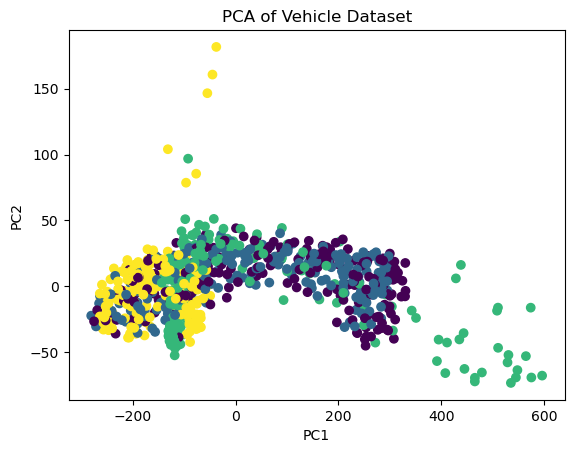

In [84]:
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('PCA of Vehicle Dataset')
plt.show()

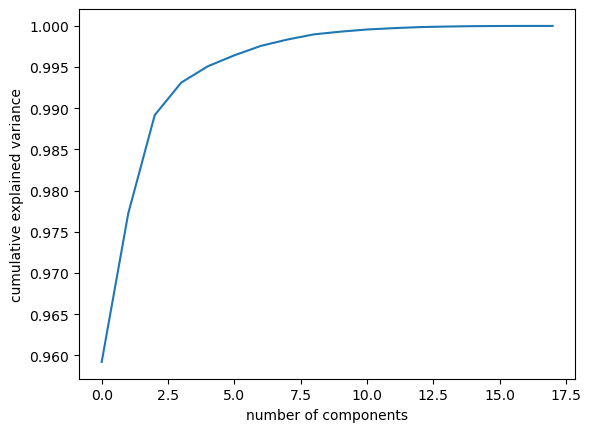

In [85]:
pca = PCA (whiten = True).fit(X) 
plt.plot(np.cumsum(pca.explained_variance_ratio_)) 
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

# ---------------------------------------------------------------------------------------------------------------

# Random Forest

EN

Random Forest is an ensemble (community) algorithm formed by many decision trees. Each decision tree is trained using random sampling and random feature selection, and as a result, the algorithm combines the predictions of these trees to make a more accurate and stable prediction.

Random Forest algorithm can be explained as follows:
1. Data Preparation: The dataset is prepared as a matrix (X) containing the features and a vector (y) containing the corresponding labels (classes or target values).
2. Creation of Decision Trees: Random Forest creates a specified number of decision trees. Each tree is trained using a random subset of the data and a random subset of the features.
3. Training the Trees: Each decision tree is trained using the selected subset of data and features. The tree creates a tree structure by recursively splitting the data based on the values of the features.
4. Prediction: New samples can be predicted using the created decision trees. Predictions from each tree are combined to make the final prediction, such as determining the class label.

TR

Random Forest, birçok karar ağacının bir araya gelerek oluşturduğu bir ensemble (topluluk) algoritmasıdır. Her bir karar ağacı, rastgele örnekleme ve rastgele öznitelik seçimi kullanarak eğitilir ve sonuçta algoritma, bu ağaçların tahminlerini birleştirerek daha doğru ve istikrarlı bir tahmin yapar.

Random Forest algoritmasının çalışma mantığı şu adımları içerir:
1. Veri kümesi ve etiketlerin hazırlanması: Veri kümesi, özelliklerin bulunduğu bir matris (X) ve bu özelliklere karşılık gelen etiketlerin (sınıfların veya hedef değerlerin) bulunduğu bir vektör (y) olarak hazırlanır.
2. Karar ağaçları oluşturma: Random Forest, belirli bir sayıda karar ağacı oluşturur. Her bir ağaç için rastgele alt veri kümesi ve rastgele alt özellik kümesi seçilir.
3. Ağaçların eğitimi: Seçilen alt veri kümesi ve özellik kümesi kullanılarak her bir karar ağacı eğitilir. Karar ağacı, verinin bölünmesiyle bir ağaç yapısı oluşturur.
4. Tahmin yapma: Oluşturulan karar ağaçları üzerinde yeni örneklerin tahmini yapılır. Her bir ağaçtan gelen tahminler birleştirilerek final tahmin yapılır (örneğin, sınıf etiketi belirlenir).

In [86]:
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=0)

In [87]:
# Building and training the Random Forest classifier model
rf = RandomForestClassifier()
rf.fit(X_train, y_train)

RandomForestClassifier()

In [88]:
# Making predictions on test data
y_pred = rf.predict(X_test)
y_pred

array([4, 3, 1, 3, 4, 4, 2, 3, 1, 4, 2, 1, 1, 1, 3, 2, 3, 2, 4, 4, 4, 1,
       2, 1, 4, 3, 4, 1, 3, 3, 1, 2, 4, 1, 4, 3, 2, 3, 4, 3, 4, 1, 1, 3,
       4, 3, 2, 3, 1, 1, 4, 3, 1, 3, 4, 3, 4, 4, 2, 2, 1, 4, 2, 1, 3, 4,
       4, 3, 2, 4, 1, 2, 2, 4, 1, 3, 4, 1, 1, 4, 3, 4, 3, 3, 1],
      dtype=int64)

In [89]:
# Calculating performance metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='micro')
recall = recall_score(y_test, y_pred, average='micro')
f1 = f1_score(y_test, y_pred, average='micro')

In [90]:
print("Accuracy Score:", accuracy)
print("Precision Score:", precision)
print("Recall Score:", recall)
print("F1 Score:", f1)

Accuracy Score: 0.8117647058823529
Precision Score: 0.8117647058823529
Recall Score: 0.8117647058823529
F1 Score: 0.8117647058823529


# -Comment-

EN

These scores are metrics used to evaluate the performance of a model. The Accuracy Score represents the model's ability to make correct predictions. The Precision Score indicates the proportion of correctly predicted positive instances out of all instances predicted as positive. The Recall Score measures the proportion of correctly predicted positive instances out of all actual positive instances. The F1 Score aims to strike a balance between Precision and Recall.

In this case, the scores indicate that the model has performed well. Since all the scores are the same, it suggests that the model has achieved high accuracy, precision, recall, and F1 score. However, it is important to determine whether these scores are acceptable based on the specific problem and dataset. To improve or increase these scores, various strategies can be employed depending on the data, such as gathering more data, applying data preprocessing techniques, tuning model parameters, or considering alternative models.

TR

Bu puanlar, modelin performansını ölçmek için kullanılan metriklerdir. Doğruluk (Accuracy) skoru, modelin doğru tahmin etme yeteneğini gösterir. Hassasiyet (Precision) skoru, modelin pozitif olarak tahmin ettiği örneklerin ne kadarının gerçekten pozitif olduğunu gösterir. Duyarlılık (Recall) skoru, gerçek pozitif örneklerin ne kadarının doğru bir şekilde pozitif olarak tahmin edildiğini gösterir. F1 skoru ise hassasiyet ve duyarlılık arasında bir denge sağlamayı hedefler.

Bu puanlar, modelin iyi bir performans sergilediğini göstermektedir. Tüm puanlar aynı olduğu için modelin yüksek bir doğruluk, hassasiyet, duyarlılık ve F1 skoruna sahip olduğunu söyleyebiliriz. Ancak, her problem ve veri seti için bu puanların kabul edilebilir bir düzeyde olup olmadığını belirlemek önemlidir. Veri setine, problem alanına ve gereksinimlere göre puanların yükseltilmesi veya iyileştirilmesi için farklı stratejiler uygulanabilir. Bunlar arasında daha fazla veri toplamak, veri ön işleme yöntemleri uygulamak, farklı model parametrelerini ayarlamak veya farklı bir model seçmek yer alabilir.

# ---------------------------------------------------------------------------------------------------------------

# Support Vector Machines (SVM)

Support Vector Machines is a machine learning algorithm used for classification and regression problems. SVM tries to find a hyperplane that separates the data well.

The basic steps involved in the SVM algorithm are:
1. Data Preparation: SVM requires a labeled dataset with features and corresponding class labels. The features should be numeric or converted into numerical representations.
2. Feature Scaling: It is essential to scale the features to a similar range to ensure fair treatment during the optimization process. Common scaling techniques include standardization (subtracting mean and dividing by standard deviation) or normalization (scaling values between 0 and 1).
3. Model Training: SVM determines the optimal hyperplane by finding support vectors, which are the data points closest to the decision boundary. The algorithm aims to maximize the margin (distance) between the support vectors of different classes.
4. Kernel Trick (optional): SVM can use a kernel function to transform the original feature space into a higher-dimensional space, allowing for better separation of classes. Common kernel functions include linear, polynomial, and radial basis function (RBF).
5. Model Evaluation: Once the SVM model is trained, it can be used to predict the class labels of unseen data points. The performance of the model can be assessed using various evaluation metrics such as accuracy, precision, recall, and F1 score.

TR

Support Vector Machines, sınıflandırma ve regresyon problemleri için kullanılan bir makine öğrenmesi algoritmasıdır. SVM, verileri iyi bir şekilde ayıran bir hiper düzlem bulmaya çalışır.

SVM algoritmasında yer alan temel adımlar:
1. Veri Hazırlama: SVM, özelliklere ve ilgili sınıf etiketlerine sahip bir etiketli veri kümesi gerektirir. Özellikler sayısal olmalı veya sayısal temsillere dönüştürülmelidir.
2. Öznitelik Ölçeklendirme: Optimizasyon sürecinde adil bir işlem sağlamak için özellikleri benzer bir aralığa ölçeklendirmek önemlidir. Yaygın ölçeklendirme teknikleri arasında standartlaştırma (ortalama çıkarma ve standart sapmaya bölme) veya normalleştirme (değerleri 0 ile 1 arasına ölçekleme) bulunur.
3. Model Eğitimi: SVM, destek vektörleri olarak adlandırılan, karar sınırına en yakın veri noktalarını bularak optimal hiperdüzlemi belirler. Algoritma, farklı sınıflara ait destek vektörler arasındaki marjinal mesafeyi (uzaklığı) maksimize etmeyi hedefler.
4. Çekirdek İşlemi (isteğe bağlı): SVM, orijinal öznitelik uzayını daha yüksek boyutlu bir uzaya dönüştürmek için bir çekirdek işlevi kullanabilir. Bu, sınıfların daha iyi şekilde ayrılmasını sağlar. Yaygın çekirdek işlevleri arasında doğrusal, polinom ve radyal baz fonksiyon (RBF) bulunur.
5. Model Değerlendirme: Eğitilen SVM modeli, görünmeyen veri noktalarının sınıf etiketlerini tahmin etmek için kullanılabilir. Modelin performansı, doğruluk, hassasiyet, geri çağırma ve F1 skoru gibi çeşitli değerlendirme metrikleri kullanılarak değerlendirilebilir.

In [91]:
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [92]:
# Build and train the SVM model
svm = SVC()
svm.fit(X_train, y_train)

SVC()

In [93]:
y_pred = svm.predict(X_test)
y_pred

array([3, 3, 3, 2, 3, 2, 3, 3, 2, 3, 3, 3, 3, 3, 3, 2, 2, 2, 3, 3, 2, 2,
       2, 4, 4, 2, 3, 2, 4, 4, 2, 2, 4, 1, 3, 3, 3, 3, 3, 3, 3, 2, 2, 2,
       3, 4, 3, 3, 3, 2, 3, 3, 3, 3, 2, 3, 4, 3, 2, 2, 3, 3, 2, 4, 4, 3,
       2, 3, 4, 2, 3, 3, 2, 2, 3, 2, 4, 4, 3, 4, 3, 3, 2, 3, 4, 4, 2, 3,
       3, 2, 3, 4, 3, 3, 3, 3, 4, 3, 3, 4, 2, 2, 2, 3, 2, 3, 4, 1, 4, 4,
       3, 3, 2, 2, 3, 3, 2, 3, 3, 3, 2, 3, 3, 2, 2, 3, 2, 3, 4, 3, 4, 3,
       2, 3, 2, 2, 2, 2, 3, 2, 2, 2, 3, 4, 3, 4, 4, 2, 3, 3, 4, 2, 4, 4,
       3, 2, 2, 2, 3, 4, 4, 2, 4, 2, 4, 3, 2, 3, 3, 3], dtype=int64)

In [94]:
# Calculating performance metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='micro')
recall = recall_score(y_test, y_pred, average='micro')
f1 = f1_score(y_test, y_pred, average='micro')

In [95]:
print("Accuracy Score:", accuracy)
print("Precision Score:", precision)
print("Recall Score:", recall)
print("F1 Score:", f1)

Accuracy Score: 0.4470588235294118
Precision Score: 0.4470588235294118
Recall Score: 0.4470588235294118
F1 Score: 0.4470588235294118


# -Comment-

EN

Based on these results, it can be said that your model is currently underperforming and not performing the classification task correctly. To increase the success of the model, we can try techniques such as data preprocessing, hyperparameter tuning, feature selection, or try different classification algorithms.

TR

Bu sonuçlara dayanarak, modelinizin mevcut durumda düşük performans gösterdiği ve sınıflandırma görevini doğru bir şekilde gerçekleştirmediği söylenebilir. Modelin başarısını artırmak için, veri ön işleme, hiperparametre ayarlama, özellik seçimi gibi teknikleri deneyebilir veya farklı sınıflandırma algoritmalarını deneyebiliriz.

# ---------------------------------------------------------------------------------------------------------------

# Clustering

EN

Clustering is a machine learning method used to group data according to certain characteristics. Clustering algorithms try to group data into clusters based on the similarity measure in the data set.

Clustering algorithms are based on different approaches and mathematical principles. Some popular clustering algorithms include:
1. K-Means: It is an iterative algorithm that assigns data points to K number of clusters/centroids. In each iteration, data points are assigned to the clusters that are closest to their centroids, and the centroids are recalculated.
2. Hierarchical Clustering: It groups data points into a hierarchical tree-like structure. This algorithm can work in two approaches: agglomerative (bottom-up) or divisive (top-down). In the agglomerative approach, each data point starts as a separate cluster, and similar clusters are merged together to form a hierarchical tree. In the divisive approach, all data points start in a single cluster, and the tree structure is built by dividing the clusters.
3. DBSCAN (Density-Based Spatial Clustering of Applications with Noise): It is a density-based clustering algorithm. This algorithm identifies dense regions and sparse regions of data points to perform clustering. Data points are assigned to clusters based on a density threshold and neighborhood relationship.

TR

Kümeleme (Clustering), verileri belirli özelliklerine göre gruplara ayırmak için kullanılan bir makine öğrenmesi yöntemidir. Kümeleme algoritmaları, veri setinde benzerlik ölçüsüne dayalı olarak verileri kümeler halinde gruplamaya çalışır.

Clustering algoritmaları farklı yaklaşımlara ve matematiksel prensiplere dayanır. En popüler clustering algoritmalarından birkaçı şunlardır:
1. K-Means: Veri noktalarını K sayısı kadar küme/merkez noktasına atayan bir iteratif algoritmadır. Her iterasyonda, veri noktaları küme merkezlerine en yakın olan kümelere atanır ve merkezler yeniden hesaplanır.
2. Hierarchical Clustering (Hiyerarşik Kümeleme): Veri noktalarını hiyerarşik bir ağaç yapısı şeklinde gruplandırır. Bu algoritma, agglomerative (birleştirici) veya divisive (ayrıştırıcı) yaklaşımlarla çalışabilir. Agglomerative yöntemde, her veri noktası ayrı bir küme olarak başlar ve benzer olan kümeler bir araya getirilerek hiyerarşik bir ağaç oluşturulur. Divisive yöntemde ise tüm veri noktaları tek bir küme olarak başlar ve ağaç yapısı parçalanarak kümeleme gerçekleştirilir.
3. DBSCAN (Density-Based Spatial Clustering of Applications with Noise): Yoğunluğa dayalı bir kümeleme algoritmasıdır. Bu algoritma, veri noktalarının yoğun bölgelerini ve seyrek bölgelerini tanımlayarak kümeleme yapar. Veri noktaları, belirli bir yoğunluk eşiği ve komşuluk ilişkisi kullanılarak kümelere atanır.

Elbow method: In this method, the total inertia value decreases as the number of clusters increases. The Elbow method tries to find the "elbow" where the rate of decline of the inertia value slows down to determine the number of clusters. We can determine the optimal number of clusters by calculating and graphing the inertia values for different cluster numbers using the Elbow method.

Elbow yöntemi: Bu yöntemde, küme sayısının artmasıyla birlikte toplam küme içi hata (inertia) değeri azalır. Elbow yöntemi, küme sayısını belirlemek için inertia değerinin düşme hızının yavaşladığı "dirsek" noktasını bulmaya çalışır. Elbow yöntemini kullanarak farklı küme sayıları için inertia değerlerini hesaplayıp, grafiğini çizerek optimal küme sayısını belirleyebiliriz.

C:\Users\dogan\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


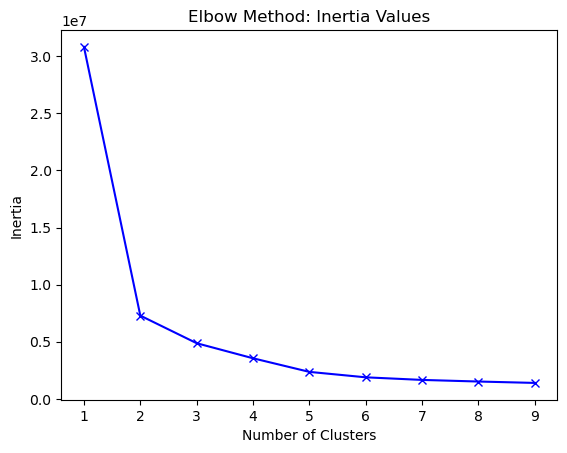

In [96]:
# Calculating inertia values for different cluster numbers
inertia_values = []
k_values = range(1, 10)  # Range of cluster numbers to test

for k in k_values:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(X)
    inertia_values.append(kmeans.inertia_)

# Graphing inertia values
plt.plot(k_values, inertia_values, 'bx-')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method: Inertia Values')
plt.show()

In [97]:
# Analyze the resulting cluster tags
cluster_labels = kmeans.labels_
clusters = pd.DataFrame({'Data Point': X.index, 'Cluster': cluster_labels})
print(clusters)

     Data Point  Cluster
0             0        4
1             1        0
2             2        0
3             3        5
4             4        8
..          ...      ...
841         841        2
842         842        2
843         843        6
844         844        2
845         845        2

[846 rows x 2 columns]


# ---------------------------------------------------------------------------------------------------------------

# Logistic Regression

EN

Logistic Regression is a popular supervised learning algorithm used for binary classification problems. It models the relationship between a set of independent variables (features) and a binary dependent variable (target) by estimating the probability of the target variable belonging to a particular class.

The algorithm uses a logistic function (also known as the sigmoid function) to model the relationship between the input features and the probability of the target variable being in the positive class. The logistic function maps any real-valued number to a value between 0 and 1, representing the probability. The logistic regression model learns the coefficients (weights) of the input features to maximize the likelihood of the observed data.

During training, the algorithm optimizes the coefficients using various optimization techniques such as gradient descent or Newton's method. The objective is to minimize a cost function, which measures the discrepancy between the predicted probabilities and the true class labels.

For visualization in logistic regression, one common approach is to plot the decision boundary. Since logistic regression is a linear classifier, the decision boundary is a straight line or a hyperplane in higher dimensions. By plotting the decision boundary along with the training data points, you can visually observe how the algorithm separates the classes.

TR

Logistic Regression, ikili sınıflandırma problemleri için kullanılan popüler bir denetimli öğrenme algoritmasıdır. Bağımlı değişkenin (hedef) iki sınıftan birine ait olma olasılığını tahmin etmek için bağımsız değişkenler kümesi (özellikler) ile arasındaki ilişkiyi modellemektedir.

Algoritma, giriş özellikleri ile hedef değişkenin pozitif sınıfa ait olma olasılığı arasındaki ilişkiyi modellemek için bir lojistik fonksiyon (sigmoid fonksiyonu) kullanır. Lojistik fonksiyon, herhangi bir gerçek değerli sayıyı 0 ile 1 arasında bir değere dönüştürerek olasılığı temsil eder. Lojistik regresyon modeli, giriş özelliklerinin katsayılarını (ağırlıklarını) öğrenerek gözlemlenen verinin olasılığı maksimize etmeye çalışır.

Eğitim sırasında algoritma, gradyan inişi veya Newton'un yöntemi gibi çeşitli optimizasyon tekniklerini kullanarak katsayıları optimize eder. Amaç, tahmin edilen olasılıklar ile gerçek sınıf etiketleri arasındaki uyumsuzluğu ölçen bir maliyet fonksiyonunu minimize etmektir.

Lojistik regresyonun görselleştirilmesi için yaygın bir yaklaşım, karar sınırını çizmektir. Lojistik regresyon bir doğrusal sınıflandırıcı olduğu için karar sınırı, düz bir çizgi veya daha yüksek boyutlarda hiper düzlemdir. Karar sınırını eğitim veri noktalarıyla birlikte çizerek algoritmanın sınıfları nasıl ayırdığını görsel olarak gözlemleyebilirsiniz.

In [98]:
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [99]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [100]:
# Build and train the Logistic Regression model
logreg = LogisticRegression(max_iter=10000)
logreg.fit(X_train_scaled, y_train)

LogisticRegression(max_iter=10000)

In [101]:
# Making predictions on test data
y_pred = logreg.predict(X_test_scaled)
y_pred

array([1, 4, 3, 1, 2, 2, 4, 3, 1, 1, 1, 4, 3, 1, 3, 2, 2, 2, 4, 3, 2, 1,
       1, 1, 4, 1, 2, 2, 4, 4, 2, 1, 4, 3, 3, 3, 1, 3, 3, 3, 4, 1, 1, 1,
       4, 4, 4, 3, 1, 1, 3, 3, 2, 4, 3, 1, 4, 4, 3, 1, 3, 2, 2, 4, 4, 3,
       2, 4, 4, 2, 4, 4, 2, 2, 3, 1, 4, 4, 3, 4, 4, 1, 2, 1, 4, 2, 2, 4,
       2, 2, 2, 4, 2, 3, 4, 4, 4, 1, 3, 4, 2, 1, 1, 4, 2, 2, 1, 1, 2, 4,
       2, 3, 2, 1, 3, 3, 1, 3, 1, 2, 2, 3, 4, 1, 2, 3, 2, 3, 1, 3, 4, 2,
       1, 4, 3, 2, 1, 1, 2, 2, 2, 1, 4, 4, 1, 4, 2, 2, 3, 3, 4, 1, 1, 2,
       4, 1, 1, 1, 1, 4, 4, 1, 1, 3, 4, 3, 1, 4, 1, 3], dtype=int64)

In [102]:
# Calculating performance metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='micro')
recall = recall_score(y_test, y_pred, average='micro')
f1 = f1_score(y_test, y_pred, average='micro')

In [103]:
print("Accuracy Score:", accuracy)
print("Precision Score:", precision)
print("Recall Score:", recall)
print("F1 Score:", f1)

Accuracy Score: 0.8352941176470589
Precision Score: 0.8352941176470589
Recall Score: 0.8352941176470589
F1 Score: 0.8352941176470589


# -Comment-

EN
1. Accuracy Score: 0.8352 - The accuracy score represents the ratio of correctly classified samples by the model. In this case, it indicates that the model has an accuracy rate of approximately 83.52%.
2. Precision Score: 0.8352 - The precision score shows the ratio of correctly predicted positive samples out of all positive predictions made by the model. It indicates that around 83.52% of the positive predictions made by the model are correct.
3. Recall Score: 0.8352 - The recall score, also known as sensitivity or true positive rate, represents the ratio of correctly predicted positive samples out of all actual positive samples. It shows that the model correctly identifies approximately 81.76% of the actual positive samples.
4. F1 Score: 0.8352 - The F1 score is the harmonic mean of precision and recall. It provides a balanced assessment of the model's performance in terms of both precision and recall. The F1 score of 83.52% indicates that the model achieves a balanced performance in identifying both positive and negative samples.

Overall, these scores suggest that the model performs reasonably well, as all metrics have similar high scores.

TR
1. Accuracy Score: 0.8352 - Doğruluk puanı, modelin doğru sınıflandırılan örneklerin oranını temsil eder. Bu durumda, modelinizin yaklaşık olarak %83.52 doğruluk oranına sahip olduğunu gösterir.
2. Precision Score: 0.8352 - Hassasiyet puanı, pozitif olarak tahmin edilen örneklerin gerçekte ne kadarının doğru olduğunu gösterir. Modelinizin pozitif tahminlerinin yaklaşık olarak %83.52'sının doğru olduğunu gösterir.
3. Recall Score: 0.8352 - Duyarlılık puanı, gerçek pozitif örneklerin ne kadarının doğru bir şekilde pozitif olarak tahmin edildiğini gösterir. Modelinizin yaklaşık olarak gerçek pozitiflerin %83.52'sini doğru bir şekilde tespit ettiğini gösterir.
4. F1 Score: 0.8352 - F1 puanı, hassasiyet ve duyarlılık arasında bir denge sağlayan bir metriktir. Bu puan, modelinizin hem hassasiyet hem de duyarlılık açısından dengeli bir performans sergilediğini gösterir.

Sonuç olarak, modelinizin genel olarak iyi bir performans sergilediği söylenebilir, çünkü tüm metrikler benzer yüksek puanlara sahiptir. 

In [104]:
models = [
    ('LR', LogisticRegression()),
    ('NB', GaussianNB()),
    ('SVM', SVC()),
    ('KNN', KNeighborsClassifier()),
    ('DT', DecisionTreeClassifier()),
    ('RF', RandomForestClassifier()),

]
models

[('LR', LogisticRegression()),
 ('NB', GaussianNB()),
 ('SVM', SVC()),
 ('KNN', KNeighborsClassifier()),
 ('DT', DecisionTreeClassifier()),
 ('RF', RandomForestClassifier())]

In [109]:
scaler = StandardScaler()
X_new = scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X_new, y, test_size=0.2, random_state=42)

for name, model in models:
    clf = model
    clf.fit(X_train, y_train)
    accuracy = clf.score(X_test, y_test)
    print("database", name, accuracy)

C:\Users\dogan\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\dogan\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid thi

database LR 0.8352941176470589
database NB 0.4411764705882353
database SVM 0.7941176470588235
database KNN 0.6941176470588235
database DT 0.7235294117647059
database RF 0.7588235294117647
